<a href="https://colab.research.google.com/github/NightMachinary/soal_playground/blob/master/Optimizer_Workshop.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Presentation Guide

The links tagged with `@toPresent` should be presented during the workshop.

## Initial Config

### 0

In [101]:
%%bash

pip install hdbscan

  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
    Preparing wheel metadata: started
    Preparing wheel metadata: finished with status 'done'
  Created wheel for hdbscan: filename=hdbscan-0.8.28-cp37-cp37m-linux_x86_64.whl size=2330834 sha256=395573b80b72be0c4191297e3fcb548797d3c5a81193fdcec0cfad527b1b5288
  Stored in directory: /root/.cache/pip/wheels/6e/7a/5e/259ccc841c085fc41b99ef4a71e896b62f5161f2bc8a14c97a
Successfully built hdbscan


In [132]:
!pip install plotly

In [133]:
import plotly.express as px

In [102]:
import hdbscan
from hdbscan import HDBSCAN

In [85]:
import numpy
np = numpy

import pandas
pd = pandas

import sklearn
sk = sklearn
import sklearn.cluster
from sklearn.cluster import KMeans, MiniBatchKMeans, DBSCAN, Birch

In [2]:
figsize = (15,8.27)

In [3]:
from matplotlib import rcParams
rcParams['figure.figsize'] = figsize

In [4]:
import seaborn as sns

# sns.set(rc={'figure.figsize': figsize})
sns.set_theme(style="whitegrid")

#### 3D plots

In [10]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

In [20]:
from matplotlib import cm

def set_axes_equal(ax, zoom_out=None):
    '''Make axes of 3D plot have equal scale so that spheres appear as spheres,
    cubes as cubes, etc..  This is one possible solution to Matplotlib's
    ax.set_aspect('equal') and ax.axis('equal') not working for 3D.

    Input
      ax: a matplotlib axis, e.g., as output from plt.gca().
    '''

    if zoom_out is None:
      zoom_out = 0.3

    x_limits = ax.get_xlim3d()
    y_limits = ax.get_ylim3d()
    z_limits = ax.get_zlim3d()

    x_range = abs(x_limits[1] - x_limits[0])
    x_middle = np.mean(x_limits)
    y_range = abs(y_limits[1] - y_limits[0])
    y_middle = np.mean(y_limits)
    z_range = abs(z_limits[1] - z_limits[0])
    z_middle = np.mean(z_limits)

    # The plot bounding box is a sphere in the sense of the infinity
    # norm, hence I call a fraction of the max range the plot radius.
    plot_radius = zoom_out * max([x_range, y_range, z_range])

    ax.set_xlim3d([x_middle - plot_radius, x_middle + plot_radius])
    ax.set_ylim3d([y_middle - plot_radius, y_middle + plot_radius])
    ax.set_zlim3d([z_middle - plot_radius, z_middle + plot_radius])

In [21]:
def scatter3d(*args, zoom_out=None, **kwargs):
  fig = plt.figure()
  ax = fig.add_subplot(111, projection='3d')
  ax.scatter(*args, **kwargs) #: (x,y,z)
  set_axes_equal(ax, zoom_out=zoom_out)
  # return fig

In [36]:
def scatter3d_arr(arr, **kwargs):
  return scatter3d(arr[:, 0],
                   arr[:, 1],
                   arr[:, 2],
                   **kwargs)

### 3D plotly

In [143]:
def scatter3d_arr(arr, cmap=None, c=None, **kwargs):
    px.scatter_3d(data_frame=arr, x=0, y=1, z=2, 
                  color=c,
                  size_max=5,
                  ).show()

### gdrive

In [5]:
%%bash

pip install -q kaggle

In [6]:
from google.colab import drive
drive.mount('/content/drive')

MessageError: ignored

### dask

In [ ]:
%%bash

pip install dask-ml

  Attempting uninstall: cloudpickle
    Found existing installation: cloudpickle 1.3.0
    Uninstalling cloudpickle-1.3.0:
      Successfully uninstalled cloudpickle-1.3.0
  Attempting uninstall: distributed
    Found existing installation: distributed 1.25.3
    Uninstalling distributed-1.25.3:
      Successfully uninstalled distributed-1.25.3


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gym 0.17.3 requires cloudpickle<1.7.0,>=1.2.0, but you have cloudpickle 2.0.0 which is incompatible.


In [ ]:
import dask_ml
import dask_ml.cluster

### Anime

In [7]:
%%bash

mkdir -p ~/.kaggle/
cp '/content/drive/MyDrive/keys/kaggle/kaggle.json' ~/.kaggle/kaggle.json
chmod 600 ~/.kaggle/kaggle.json

In [8]:
%%bash

kaggle datasets download -d marlesson/myanimelist-dataset-animes-profiles-reviews

myanimelist-dataset-animes-profiles-reviews.zip: Skipping, found more recently modified local copy (use --force to force download)


In [9]:
%%bash

yes | unzip myanimelist-dataset-animes-profiles-reviews.zip

pwd
ls -lh

Archive:  myanimelist-dataset-animes-profiles-reviews.zip
  inflating: animes.csv              
  inflating: profiles.csv            
  inflating: reviews.csv             
/content
total 891M
-rw-r--r-- 1 root root  12M Jan  5  2020 animes.csv
drwx------ 5 root root 4.0K Apr  8 09:22 drive
-rw-r--r-- 1 root root 217M Apr  8 09:32 myanimelist-dataset-animes-profiles-reviews.zip
-rw-r--r-- 1 root root 8.3M Jan  5  2020 profiles.csv
-rw-r--r-- 1 root root 655M Jan  5  2020 reviews.csv
drwxr-xr-x 1 root root 4.0K Mar 23 14:22 sample_data


replace animes.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: replace profiles.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: replace reviews.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [2]:
reviews_path = '/content/reviews.csv'
anime_path = '/content/animes.csv'

### IMDB Top 250

In [37]:
%%bash 

mkdir imdb_top_250
cd imdb_top_250

kaggle datasets download -d ramjasmaurya/top-250s-in-imdb

100%|██████████| 97.9k/97.9k [00:00<00:00, 25.6MB/s]


In [38]:
%%bash

cd imdb_top_250

yes | unzip top-250s-in-imdb.zip

pwd
ls -lh

Archive:  top-250s-in-imdb.zip
  inflating: imdb(MOVIES).csv        
  inflating: imdb(SERIES).csv        
  inflating: imdb(VIDEO GAMES).csv   
/content/imdb_top_250
total 328K
-rw-r--r-- 1 root root 76K Jan  1 15:57 imdb(MOVIES).csv
-rw-r--r-- 1 root root 70K Jan  1 15:57 imdb(SERIES).csv
-rw-r--r-- 1 root root 78K Jan  1 15:57 imdb(VIDEO GAMES).csv
-rw-r--r-- 1 root root 98K Apr  8 12:29 top-250s-in-imdb.zip


In [40]:
imdb_250_movies_path = '/content/imdb_top_250/imdb(MOVIES).csv'

# Virtual Environments
Estimated time: 45 minutes

## Reading Further

* [12. Virtual Environments and Packages — Python 3.10.4 documentation](https://docs.python.org/3/tutorial/venv.html)

## What?
Python applications will often use packages and modules that don’t come as part of the standard library. Applications will sometimes need a specific version of a library, because the application may require that a particular bug has been fixed or the application may be written using an obsolete version of the library’s interface.

This means it may not be possible for one Python installation to meet the requirements of every application. If application A needs version 1.0 of a particular module but application B needs version 2.0, then the requirements are in conflict and installing either version 1.0 or 2.0 will leave one application unable to run.

The solution for this problem is to create a virtual environment, a self-contained directory tree that contains a Python installation for a particular version of Python, plus a number of additional packages.

Different applications can then use different virtual environments. To resolve the earlier example of conflicting requirements, application A can have its own virtual environment with version 1.0 installed while application B has another virtual environment with version 2.0. If application B requires a library be upgraded to version 3.0, this will not affect application A’s environment.

## How?

### Conda

#### Reading Further
* [User guide — conda 4.12.0.post16+7651023c documentation](https://docs.conda.io/projects/conda/en/latest/user-guide/index.html)
* [Cheat sheet — conda 4.12.0.post16+7651023c documentation](https://docs.conda.io/projects/conda/en/latest/user-guide/cheatsheet.html)

#### Installation

- [Installation — conda 4.12.0.post16+7651023c documentation](https://docs.conda.io/projects/conda/en/latest/user-guide/install/index.html)


##### Installing on Linux

In [ ]:
%%bash

wget https://repo.anaconda.com/miniconda/Miniconda3-latest-Linux-x86_64.sh
bash ./Miniconda3-latest-*.sh -p "$HOME/miniconda3"

##### [Installing on Windows](https://docs.conda.io/projects/conda/en/latest/user-guide/install/windows.html)

1.  Download the installer:

    -   [Miniconda installer for Windows](https://conda.io/miniconda.html).

    -   [Anaconda installer for Windows](https://www.anaconda.com/download/).

2.  Double-click the `.exe` file.

3.  Follow the instructions on the screen.

    If you are unsure about any setting, accept the defaults. You can change them later.

    When installation is finished, from the **Start** menu, open the Anaconda Prompt.

4.  Test your installation. In your terminal window or Anaconda Prompt, run the command `conda list`. A list of installed packages appears if it has been installed correctly.


#### Managing environments

Create a new environment named ENVNAME with 
specific version of Python and packages installed. 

```bash
conda create --name ENVNAME python=3.9 "PKG1>7.6" PKG2
```

E.g.,
```bash
conda create --name e1 python=3.10 numpy pandas jupyter matplotlib scikit-learn 
```

##### Activate a named Conda environment
```bash
conda activate ENVNAME
```

You can list all discoverable environments with `conda info --envs`.

##### List all packages and versions in the active environment
```
conda list
```

##### Delete an entire environment
```
conda remove --name ENVNAME --all
```

##### Installing packages
###### pip
```bash
pip install --upgrade numpy
```
###### Conda

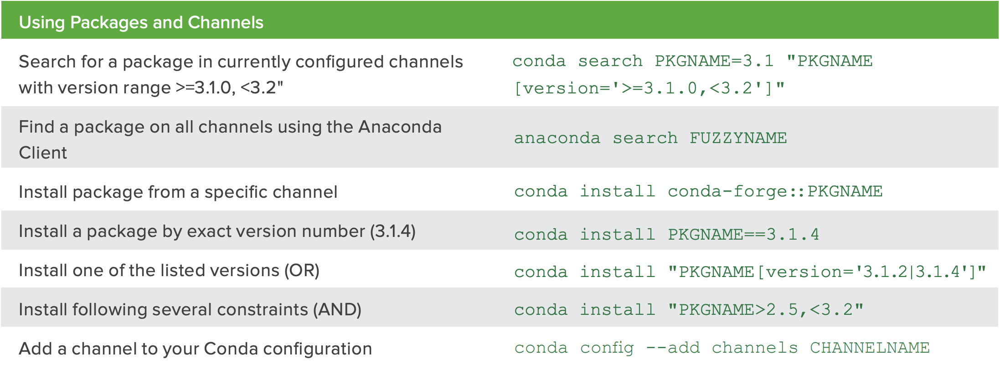

#### PATH
```bash
which python pip python3 pip3
```

```bash
/Users/evar/anaconda/bin/python
/Users/evar/anaconda/bin/pip
/Users/evar/anaconda/bin/python3
/Users/evar/anaconda/bin/pip3
```

Sometimes the path you see from `which` is a symbolic link; in these cases, you need to use `realpath` from `GNU coreutils` to see the actual location.
```bash
realpath "$(which python)"
```

```bash
/Users/evar/anaconda/bin/python3.7
```

# Jupyter Notebooks

We will only cover Google Colab in this workshop, but the following Real Python tutorial is a concise and easy introduction to Jupyter.

### Reading Further


- [Jupyter Notebook: An Introduction – Real Python](https://realpython.com/jupyter-notebook-introduction/)

## Google Colab

Estimated time: 15 minutes

- [Google Colaboratory](https://colab.research.google.com/)

- @toPresent [Overview of Colaboratory Features](https://colab.research.google.com/notebooks/basic_features_overview.ipynb)



### Open Jupyter notebooks

Go to the `File` menu, then click `Open notebook`.

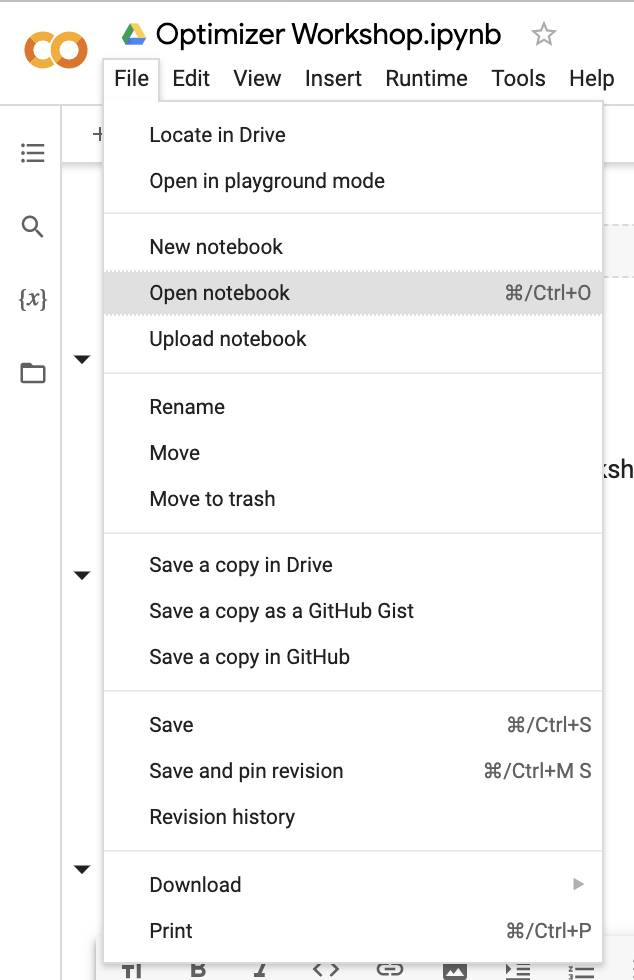

You can then open notebooks from a variety of sources. 

Choose `Upload` to upload a file from your local computer.

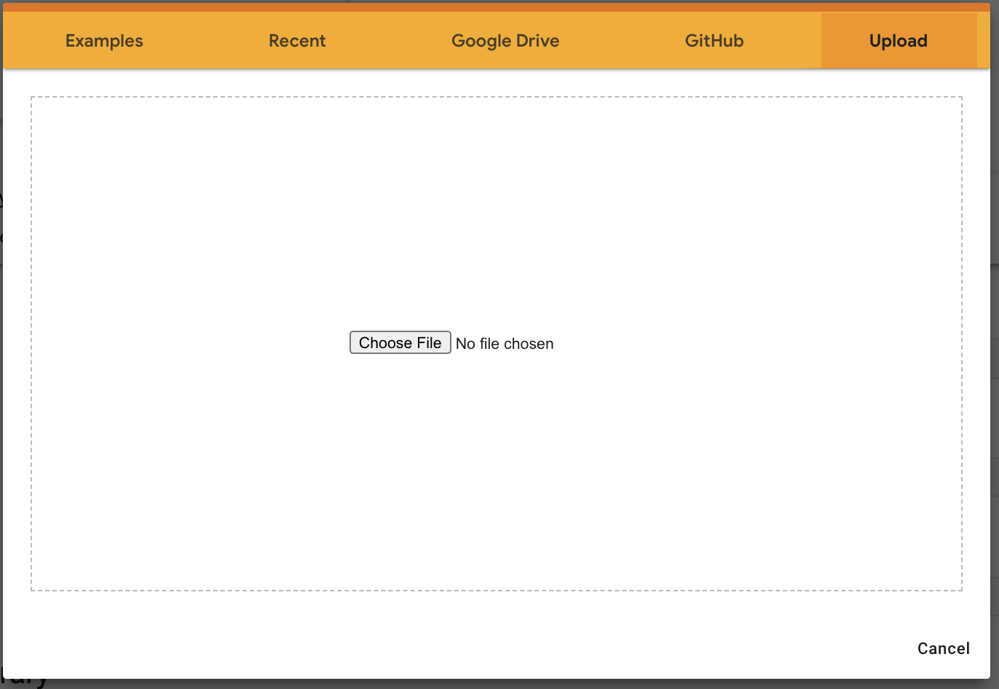

### Export notebooks

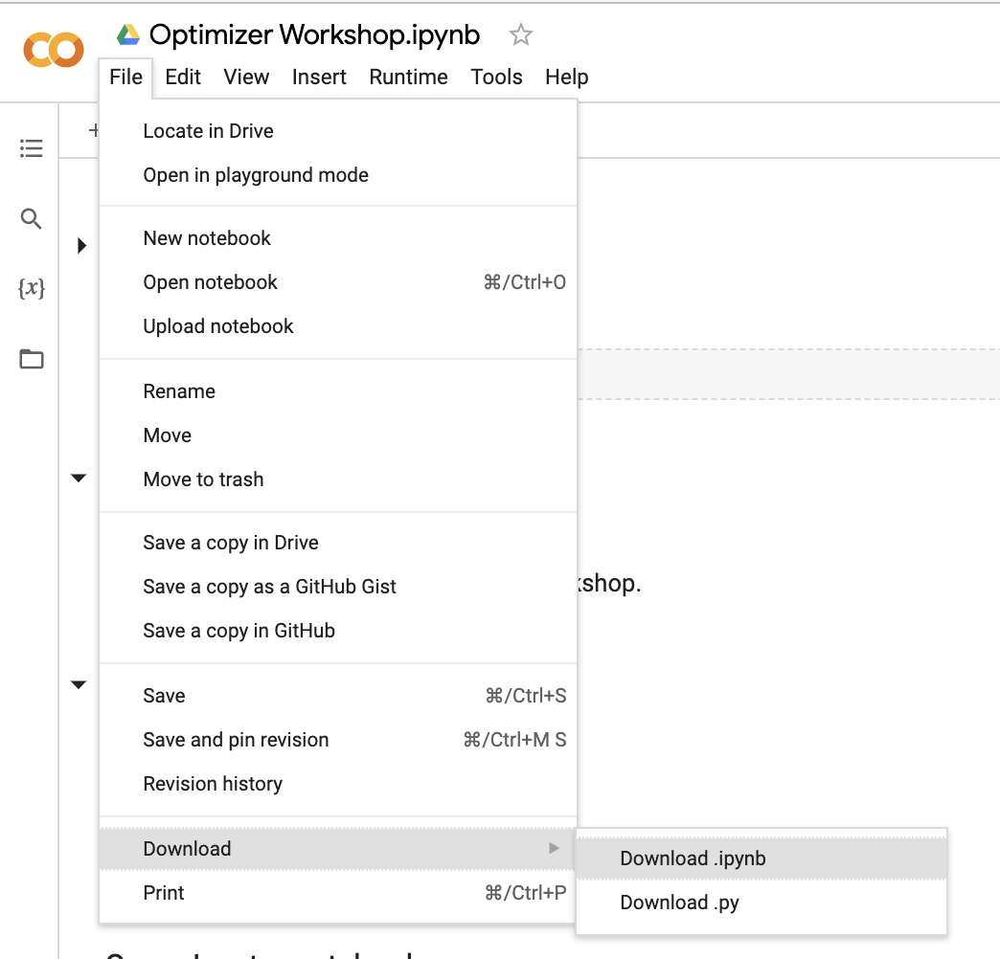

### Installing packages on Colab

Use `%%bash` as the first line of the code block to write shell (terminal) code.

In [ ]:
%%bash

pip install --upgrade scikit-learn

ERROR: Invalid requirement: 'scikit-**learn**'


### Using a GPU


Before running anything, you need to tell Colab that you are interested in using a GPU. You can do this by clicking on the 'Runtime' tab and selecting 'Change runtime type'. A pop-up window will open up with a drop-down menu.

![](https://course.fast.ai/images/colab/03.png)

Select 'GPU' from the menu and click 'Save'.

![](https://course.fast.ai/images/colab/04.png)**bold text**

### Tips


- Don't use a GPU unless you have to.
  + Consider using TPUs instead of a GPU.
- Idling will kill your session quickly.
- You can buy Colab Pro from Iranian resellers such as:
  + https://www.iranicard.ir/payments/
- You can SSH into a Colab session:
```bash
pkill -9 tmate
wget -nc https://github.com/tmate-io/tmate/releases/download/2.4.0/tmate-2.4.0-static-linux-i386.tar.xz
tar --skip-old-files -xvf tmate-2.4.0-static-linux-i386.tar.xz
rm -f nohup.out
nohup ./tmate-2.4.0-static-linux-i386/tmate -S /tmp/tmate.sock new-session -d
./tmate-2.4.0-static-linux-i386/tmate -S /tmp/tmate.sock wait tmate-ready
./tmate-2.4.0-static-linux-i386/tmate -S /tmp/tmate.sock display -p "Connect with SSH address: #{tmate_ssh}"
./tmate-2.4.0-static-linux-i386/tmate -S /tmp/tmate.sock display -p "Connect with web: #{tmate_web}"
```


# numpy

estimated time : 40 min


## Installation

In [ ]:
%%bash

pip install numpy

## Usage

In [ ]:
import numpy as np
a = np.array([1, 2, 3])

To find the number of dimensions of the array:

In [ ]:
a = np.arange(2, 9, 2)
a

array([2, 4, 6, 8])

In [ ]:
a.ndim


1

To find the total number of elements in the array:

In [ ]:
a.size

4

And to find the shape of your array:

In [ ]:
a.shape

(4,)

## Basic Functions

For an array that contains a range of evenly spaced intervals we should specify the first number, last number, and the step size

In [ ]:
a = np.arange(2, 9, 2)
a

array([2, 4, 6, 8])

##Specifying your data type

In [ ]:
x = np.ones(2, dtype=np.int64)
x

array([1, 1])

we can also convert data types to each other. For example:

In [ ]:
x = np.array([1 , 2 , 2.5])
x

array([1. , 2. , 2.5])

In [ ]:
x.dtype

dtype('float64')

In [ ]:
x = x.astype(int)
x

array([1, 2, 2])

In [ ]:
x.dtype

dtype('int64')

##Reshaping an array :

In [ ]:
a = np.arange(6)
print(a)

[0 1 2 3 4 5]


In [ ]:
b = a.reshape(3, 2)
print(b)

[[0 1]
 [2 3]
 [4 5]]


If one dimention would be -1 reshaping would occur automatically

In [ ]:
b = a.reshape(3 , -1)
print(b)

[[0 1]
 [2 3]
 [4 5]]


##Slicing data & methods for concatenating seperate parts:

In [ ]:
#slicing data :
a = np.array([1,  2,  3,  4,  5,  6,  7,  8,  9, 10])
arr1 = a[3:8]
arr1

array([4, 5, 6, 7, 8])

We can also split data in two directions (horizontal with hsplit() like this ): 

In [ ]:
np.hsplit(a, 5)

[array([1, 2]), array([3, 4]), array([5, 6]), array([7, 8]), array([ 9, 10])]

concatenating in two directions :

In [ ]:
a1 = np.array([[1, 1],[2, 2]])
a2 = np.array([[3, 3],[4, 4]])


In [ ]:
np.vstack((a1, a2))

array([[1, 1],
       [2, 2],
       [3, 3],
       [4, 4]])

In [ ]:
np.hstack((a1, a2))

array([[1, 1, 3, 3],
       [2, 2, 4, 4]])

##Some basic operations:


1.  arr1 / arr2 , * , + , - (element by element)
2.   array.max() , min() , sum() , ...

A sample is shown bellow :

In [ ]:
a.max()

10

In [ ]:
a + np.arange(10)

array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19])

##How to get unique items and counts:

In [ ]:
a = np.array([11, 11, 12, 13, 14, 15, 16, 17, 12, 13, 11, 14, 18, 19, 20])
unique_values = np.unique(a)
print(unique_values)

[11 12 13 14 15 16 17 18 19 20]


In [ ]:
len(unique_values)

10

## Vectorization

numpy's backend(s) are written in low-level languages such as C. So the more the program runs through numpy APIs and avoids Python code, the faster it is.

Broadcasting is a common technique to avoid Python loops.

##Broadcasting

In [ ]:
a = np.array([1.0, 2.0, 3.0])
b = 2.0
a * b

array([2., 4., 6.])

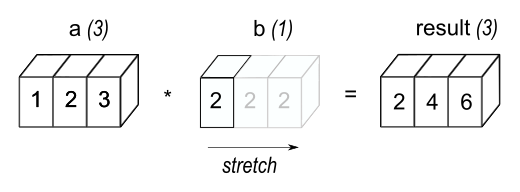

In [ ]:
a = np.array([1.0, 2.0, 3.0])
b = np.array([2.0, 2.0, 2.0])
a * b

array([2., 4., 6.])

-------

When operating on two arrays, NumPy compares their shapes element-wise. It starts with the trailing (i.e. rightmost) dimensions and works its way left. Two dimensions are compatible when


1.   they are equal, or
2.   one of them is 1

The size of the resulting array is the size that is not 1 along each axis of the inputs.

If these conditions are not met, a `ValueError: operands could not be broadcast together` exception is thrown, indicating that the arrays have incompatible shapes. 


Arrays do not need to have the same *number* of dimensions. For example, if you have a `256x256x3` array of RGB values, and you want to scale each color in the image by a different value, you can multiply the image by a one-dimensional array with 3 values. Lining up the sizes of the trailing axes of these arrays according to the broadcast rules, shows that they are compatible:

``` example
Image  (3d array): 256 x 256 x 3
Scale  (1d array):             3
Result (3d array): 256 x 256 x 3
```

When either of the dimensions compared is one, the other is used. In other words, dimensions with size 1 are stretched or "copied" to match the other.


-------

An example of broadcasting when a 1-d array is added to a 2-d array:

In [ ]:
a = np.array([[ 0.0,  0.0,  0.0],
           [10.0, 10.0, 10.0],
           [20.0, 20.0, 20.0],
           [30.0, 30.0, 30.0]])
a.shape

(4, 3)

In [ ]:
b = np.array([1.0, 2.0, 3.0])
b.shape

(3,)

In [ ]:
res = a + b
res

array([[ 1.,  2.,  3.],
       [11., 12., 13.],
       [21., 22., 23.],
       [31., 32., 33.]])

In [ ]:
res.shape

(4, 3)

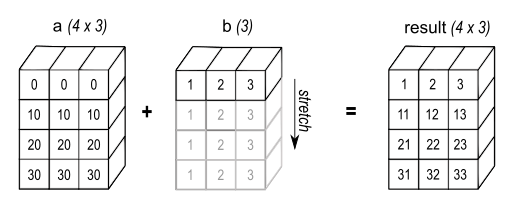

-------

In [ ]:
a = np.array([0.0, 10.0, 20.0, 30.0])
a = a.reshape(-1, 1) # equivalent to `a = a[:, np.newaxis]`
a

array([[ 0.],
       [10.],
       [20.],
       [30.]])

In [ ]:
b = np.array([1.0, 2.0, 3.0])
a + b

array([[ 1.,  2.,  3.],
       [11., 12., 13.],
       [21., 22., 23.],
       [31., 32., 33.]])

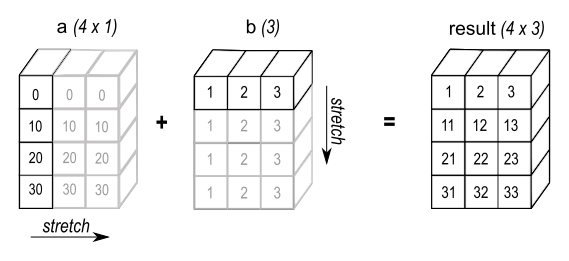

-------

But for example in this case it is not possible:

In [ ]:
b = np.array([1.0, 2.0, 3.0, 4.0])
b.shape

(4,)

In [ ]:
a + b

ValueError: ignored

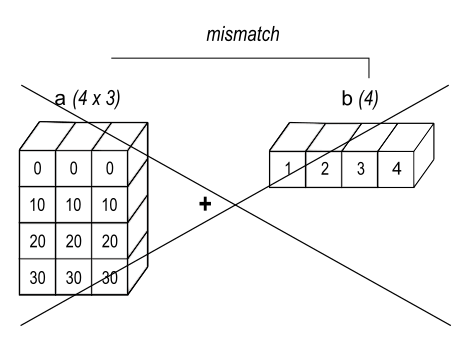

--------

For example, if `a.shape` is (5,1), `b.shape` is (1,6), `c.shape` is (6,) and `d.shape` is () so that *d* is a scalar, then *a*, *b*, *c*, and *d* are all broadcastable to dimension (5,6); and

-   *a* acts like a (5,6) array where `a[:,0]` is broadcast to the other columns,

-   *b* acts like a (5,6) array where `b[0,:]` is broadcast to the other rows,

-   *c* acts like a (1,6) array and therefore like a (5,6) array where `c[:]` is broadcast to every row, and finally,

-   *d* acts like a (5,6) array where the single value is repeated.


Here are some more examples:

``` example
A      (2d array):  5 x 4
B      (1d array):      1
Result (2d array):  5 x 4

A      (2d array):  5 x 4
B      (1d array):      4
Result (2d array):  5 x 4

A      (3d array):  15 x 3 x 5
B      (3d array):  15 x 1 x 5
Result (3d array):  15 x 3 x 5

A      (3d array):  15 x 3 x 5
B      (2d array):       3 x 5
Result (3d array):  15 x 3 x 5

A      (3d array):  15 x 3 x 5
B      (2d array):       3 x 1
Result (3d array):  15 x 3 x 5
```


## Mathematical Functions

Numpy has the mathematical functions like python. You can check them in numpy documentaion in 'Reading Further' section. For example:

In [ ]:
a = np.ones(4)
a

array([1., 1., 1., 1.])

In [ ]:
a = a * np.pi/6
a

array([0.52359878, 0.52359878, 0.52359878, 0.52359878])

In [ ]:
res = np.sin(a)
res

array([0.5, 0.5, 0.5, 0.5])

## Reading Further

- [NumPy: the absolute basics for beginners — NumPy v1.22 Manual](https://numpy.org/doc/stable/user/absolute_beginners.html)
- [Broadcasting — NumPy v1.22 Manual](https://numpy.org/doc/stable/user/basics.broadcasting.html)

# matplotlib

`matplotlib` is pretty complex. We will only cover it in so far as it is used in other examples.

You can check their [gallery](https://matplotlib.org/stable/gallery/index.html) and simply copy the code for the plot you need.

## Reading Further

- [Pyplot tutorial — Matplotlib 3.5.1 documentation](https://matplotlib.org/stable/tutorials/introductory/pyplot.html)

# seaborn

Seaborn is a library for making statistical graphics in Python. It builds on top of matplotlib and integrates closely with pandas data structures.
The Following link is an introduction to Seaborn library and it may help you in drawing different kinds of plots by using this library : 
https://seaborn.pydata.org/introduction.html

### Reading Further

- [An introduction to seaborn — seaborn 0.11.2 documentation](https://seaborn.pydata.org/introduction.html)
- [User guide and tutorial — seaborn 0.11.2 documentation](https://seaborn.pydata.org/tutorial.html)
- [Example gallery — seaborn 0.11.2 documentation](https://seaborn.pydata.org/examples/index.html)

## plotly

### Reading Further
- [plotly: Getting Started](https://plotly.com/python/getting-started/)

# pandas

estimated time : 45 min

## Reading Further

- @toPresent [10 minutes to pandas — pandas 1.4.1 documentation](https://pandas.pydata.org/docs/user_guide/10min.html) 
  - Object creation
  - Viewing data
  - Selection
  - Missing data
  - Operations
  - Merge
  - Grouping
- [Intro to data structures — pandas 1.4.1 documentation](https://pandas.pydata.org/docs/user_guide/dsintro.html)
- [Essential basic functionality — pandas 1.4.1 documentation](https://pandas.pydata.org/docs/user_guide/basics.html)
- [Indexing and selecting data — pandas 1.4.1 documentation](https://pandas.pydata.org/docs/user_guide/indexing.html)
- [IO tools (text, CSV, HDF5, …) — pandas 1.4.1 documentation](https://pandas.pydata.org/docs/user_guide/io.html)

## Installation

In [ ]:
%%bash

pip install pandas

## Usage

In [ ]:
import pandas as pd 


##Loading csv files : 



In [ ]:

df = pd.read_csv('/content/sample_data/california_housing_train.csv')
df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
0,-114.31,34.19,15.0,5612.0,1283.0,1015.0,472.0,1.4936,66900.0
1,-114.47,34.40,19.0,7650.0,1901.0,1129.0,463.0,1.8200,80100.0
2,-114.56,33.69,17.0,720.0,174.0,333.0,117.0,1.6509,85700.0
3,-114.57,33.64,14.0,1501.0,337.0,515.0,226.0,3.1917,73400.0
4,-114.57,33.57,20.0,1454.0,326.0,624.0,262.0,1.9250,65500.0
...,...,...,...,...,...,...,...,...,...
16995,-124.26,40.58,52.0,2217.0,394.0,907.0,369.0,2.3571,111400.0
16996,-124.27,40.69,36.0,2349.0,528.0,1194.0,465.0,2.5179,79000.0
16997,-124.30,41.84,17.0,2677.0,531.0,1244.0,456.0,3.0313,103600.0
16998,-124.30,41.80,19.0,2672.0,552.0,1298.0,478.0,1.9797,85800.0


## Series

In [ ]:
s = pd.Series([1, 3, 5, np.nan, 6, 8])
s

0    1.0
1    3.0
2    5.0
3    NaN
4    6.0
5    8.0
dtype: float64

The essential difference is the presence of the index: while the Numpy Array has an implicitly defined integer index used to access the values, the Pandas Series has an explicitly defined index associated with the values.

This explicit index definition gives the Series object additional capabilities. For example, the index need not be an integer, but can consist of values of any desired type. For example, if we wish, we can use strings as an index:

In [ ]:
data = pd.Series([0.25, 0.5, 0.75, 1.0],
                 index=['a', 'b', 'c', 'd'])
data

a    0.25
b    0.50
c    0.75
d    1.00
dtype: float64

In [ ]:
data['c']

0.75

## DataFrame

### Creation

In [ ]:
data = {
    "name" : ["ali" , "erfan" , "amir"],
    "lastname": ["mohammadi" , "mohammadi" , "kamali"],
    "password" : ["123" , "12535" , "55846123"]
}
df = pd.DataFrame(data)
df

,name,lastname,password
0,ali,mohammadi,123
1,erfan,mohammadi,12535
2,amir,kamali,55846123


In [ ]:
df.dtypes

name        object
lastname    object
password    object
dtype: object

##Accessing Fields of DataFrame

In [ ]:
df["password"]

0         123
1       12535
2    55846123
Name: password, dtype: object

Access multiple axis :


In [ ]:
df[['password' , 'name']]

,password,name
0,123,ali
1,12535,erfan
2,55846123,amir


Working with rows : (loc and iloc)

In [ ]:
df.iloc[0]

name              ali
lastname    mohammadi
password          123
Name: 0, dtype: object

In [ ]:
df.iloc[[0,2]]

,name,lastname,password
0,ali,mohammadi,123
2,amir,kamali,55846123


combination of both : 

In [ ]:
df.iloc[[0,2] , [0,1]]


,name,lastname
0,ali,mohammadi
2,amir,kamali


Also we can call  by lable with loc:

In [ ]:
df.loc[[0,2] , ['password' , 'name']]

,password,name
0,123,ali
2,55846123,amir


##Making filters for a dataframe

In [ ]:
filt = (df['lastname'] == "mohammadi")

In [ ]:
df[filt]

,name,lastname,password
0,ali,mohammadi,123
1,erfan,mohammadi,12535


In [ ]:
df.loc[~filt , ['name' , 'lastname']]

,name,lastname
2,amir,kamali


##Add/Remove rows and columns from DataFrame

Add columns:

In [ ]:
full_name = df['name'] + ' ' + df['lastname']
full_name

0      ali mohammadi
1    erfan mohammadi
2        amir kamali
dtype: object

In [ ]:
type(full_name)

pandas.core.series.Series

In [ ]:
full_name = full_name.astype("string")
full_name

0      ali mohammadi
1    erfan mohammadi
2        amir kamali
dtype: string

In [ ]:
df['Full_name'] = full_name
df


,name,lastname,password,Full_name
0,ali,mohammadi,123,ali mohammadi
1,erfan,mohammadi,12535,erfan mohammadi
2,amir,kamali,55846123,amir kamali


In [ ]:
df.dtypes

name         object
lastname     object
password     object
Full_name    string
dtype: object

Removing Columns:

In [ ]:
df.drop(columns=['lastname' , 'name'] , inplace=True)
df

,password,Full_name
0,123,ali mohammadi
1,12535,erfan mohammadi
2,55846123,amir kamali


Add Columns with spliting:

In [ ]:
first_last = df['Full_name'].str.split(' ' , expand=True)
first_last

,0,1
0,ali,mohammadi
1,erfan,mohammadi
2,amir,kamali


In [ ]:
df[['First_Name' , 'Last_Name']] = first_last
df

,password,Full_name,First_Name,Last_Name
0,123,ali mohammadi,ali,mohammadi
1,12535,erfan mohammadi,erfan,mohammadi
2,55846123,amir kamali,amir,kamali


Add Row:

In [ ]:
df = df.append({'First_Name' : 'ali' , 'Last_Name' : 'alavi'} , ignore_index=True)
df

,password,Full_name,First_Name,Last_Name
0,123,ali mohammadi,ali,mohammadi
1,12535,erfan mohammadi,erfan,mohammadi
2,55846123,amir kamali,amir,kamali
3,NaN,NaN,ali,alavi


Remove Row:

In [ ]:
df = df.drop(index = df[df['Last_Name'] == 'alavi'].index)
df

,password,Full_name,First_Name,Last_Name
0,123,ali mohammadi,ali,mohammadi
1,12535,erfan mohammadi,erfan,mohammadi
2,55846123,amir kamali,amir,kamali


##Sorting Data

In [ ]:
df.sort_values(by = 'lastname')

,name,lastname,password
2,amir,kamali,55846123
0,ali,mohammadi,123
1,erfan,mohammadi,12535


In [ ]:
df.sort_values(by = ['lastname' , 'name'] , ascending = False)

,name,lastname,password
1,erfan,mohammadi,12535
0,ali,mohammadi,123
2,amir,kamali,55846123


# scikit-learn

estimated time : 50 min

### Reading Further
- @toPresent [Comparing different clustering algorithms on toy datasets](https://scikit-learn.org/stable/auto_examples/cluster/plot_cluster_comparison.html)
- [MNIST Kaggle Digit clusterization using KMeans](https://sbrouil.github.io/ml-sandbox/MNIST+Kaggle+Digit+clusterization+using+KMeans.html)

### 0

In [ ]:
import seaborn as sns

Example of sklearn.datasets functions : 

In [ ]:
import matplotlib.pyplot as plt
from pandas import DataFrame
from sklearn.datasets import make_blobs

This is  a sample dataset generation for testing clustering algorithms 

In [ ]:
X,_ = make_blobs(n_samples=1000 , centers=5 , n_features=2 , random_state=100)
df = DataFrame(dict(x= X[:,0] , y= X[:,1]))


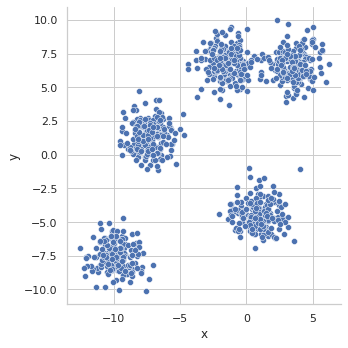

In [ ]:
g = sns.relplot(
    data=df,
    x="x", y="y",
)

## Clustering Sample

Here is a clustering sample by K_means:


In [ ]:
from sklearn.cluster import KMeans

fit_predict function returns an array that shows elements' clustering groups

In K_means method we have to give the number of expected clustering groups as input with: (n_clusters=1,2,3,..)

In [ ]:
#we use dataframe in previous section
kmeans = KMeans(n_clusters=5)
cluster_group = kmeans.fit_predict(df)
cluster_group

array([4, 3, 3, 4, 2, 0, 3, 1, 1, 2, 0, 2, 4, 2, 4, 3, 2, 2, 3, 2, 2, 1,
       4, 0, 3, 3, 2, 4, 1, 3, 4, 1, 1, 1, 3, 2, 3, 3, 3, 1, 3, 1, 2, 0,
       2, 1, 1, 0, 4, 0, 0, 0, 4, 2, 1, 2, 0, 3, 0, 3, 0, 0, 2, 1, 0, 3,
       0, 1, 0, 1, 4, 2, 4, 1, 0, 2, 2, 4, 4, 2, 1, 1, 0, 3, 3, 0, 2, 2,
       2, 1, 1, 4, 1, 0, 1, 3, 1, 1, 1, 0, 4, 2, 1, 1, 1, 4, 2, 2, 3, 1,
       2, 2, 3, 3, 3, 1, 1, 1, 3, 0, 3, 4, 4, 4, 1, 2, 3, 4, 3, 4, 4, 1,
       2, 2, 2, 4, 2, 4, 4, 3, 2, 1, 4, 3, 0, 1, 2, 0, 0, 0, 2, 1, 1, 4,
       0, 2, 4, 1, 2, 1, 4, 2, 1, 3, 0, 0, 0, 2, 3, 4, 0, 3, 1, 3, 3, 4,
       4, 0, 3, 4, 2, 3, 0, 4, 0, 1, 3, 4, 0, 1, 2, 1, 1, 3, 4, 1, 2, 4,
       0, 0, 1, 1, 4, 0, 2, 1, 0, 4, 0, 4, 2, 3, 3, 3, 1, 2, 1, 2, 2, 1,
       3, 1, 2, 2, 3, 1, 0, 4, 4, 0, 4, 2, 2, 4, 2, 4, 0, 1, 3, 0, 1, 3,
       1, 3, 2, 1, 0, 3, 3, 4, 1, 0, 4, 4, 3, 2, 1, 3, 1, 0, 1, 0, 4, 0,
       3, 3, 2, 0, 3, 3, 2, 0, 0, 2, 4, 4, 4, 4, 1, 3, 0, 3, 2, 3, 2, 4,
       0, 3, 1, 3, 2, 0, 1, 0, 3, 1, 3, 0, 4, 3, 4,

Now we add a column of cluster group to data frame:


In [ ]:
df['cluster_group'] = cluster_group

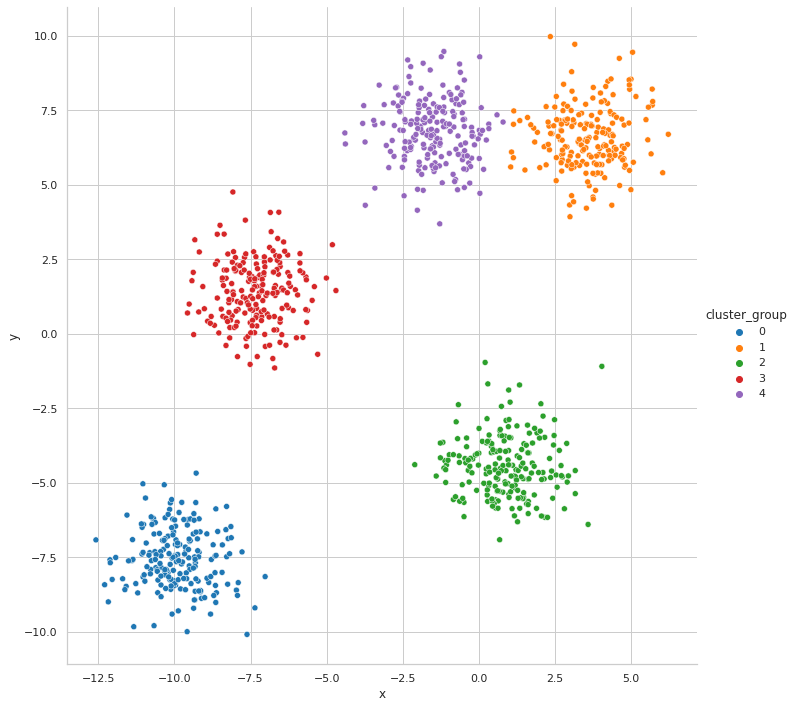

In [ ]:
g = sns.relplot(
    data=df,
    x="x", y="y",
    hue = "cluster_group",
    palette='tab10',
    height=10,
)

## 3D models

In [1]:
%%bash

pip install -U open3d

  Attempting uninstall: tornado
    Found existing installation: tornado 5.1.1
    Uninstalling tornado-5.1.1:
      Successfully uninstalled tornado-5.1.1
  Attempting uninstall: pygments
    Found existing installation: Pygments 2.6.1
    Uninstalling Pygments-2.6.1:
      Successfully uninstalled Pygments-2.6.1
  Attempting uninstall: jupyter-client
    Found existing installation: jupyter-client 5.3.5
    Uninstalling jupyter-client-5.3.5:
      Successfully uninstalled jupyter-client-5.3.5
  Attempting uninstall: setuptools
    Found existing installation: setuptools 57.4.0
    Uninstalling setuptools-57.4.0:
      Successfully uninstalled setuptools-57.4.0
  Attempting uninstall: jinja2
    Found existing installation: Jinja2 2.11.3
    Uninstalling Jinja2-2.11.3:
      Successfully uninstalled Jinja2-2.11.3
  Attempting uninstall: nbconvert
    Found existing installation: nbconvert 5.6.1
    Uninstalling nbconvert-5.6.1:
      Successfully uninstalled nbconvert-5.6.1
  Attempti

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.8.0 requires tf-estimator-nightly==2.8.0.dev2021122109, which is not installed.
google-colab 1.0.0 requires tornado~=5.1.0; python_version >= "3.0", but you have tornado 6.1 which is incompatible.
flask 1.1.4 requires Jinja2<3.0,>=2.10.1, but you have jinja2 3.1.1 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [2]:
%%bash

o='/content/clutter-models.zip'
curl https://vision.in.tum.de/_media/data/datasets/clutter/clutter-models.zip --output "$o"

unzip "$o"

Archive:  /content/clutter-models.zip
   creating: models/
  inflating: models/armadillo_final.ply  
  inflating: models/bunny_final.ply  
  inflating: models/cat1_final.ply   
  inflating: models/centaur1_final.ply  
  inflating: models/cheff_final.ply  
  inflating: models/chicken_final.ply  
  inflating: models/david2_final.ply  
  inflating: models/dog7_final.ply   
  inflating: models/dragon_final.ply  
  inflating: models/face_final.ply   
  inflating: models/ganesha_final.ply  
  inflating: models/gorilla0_final.ply  
  inflating: models/gun0026_final.ply  
  inflating: models/horse7_final.ply  
  inflating: models/lioness13_final.ply  
  inflating: models/para_final.ply   
  inflating: models/rhino_final.ply  
  inflating: models/trex_final.ply   
  inflating: models/victoria3_final.ply  
  inflating: models/wolf2_final.ply  


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 46.3M  100 46.3M    0     0  14.2M      0  0:00:03  0:00:03 --:--:-- 14.2M


In [7]:
import open3d as o3d

(100000, 3)


array([[ -65.14414978,  -31.94586754,   62.09113312],
       [ -65.13986969,  -31.71138763,   62.87960815],
       [ -26.04615593,   64.50606537, -106.89951324],
       ...,
       [  17.20939827,   72.07497406,  -98.53003693],
       [ -25.05833817,   22.0669136 ,  -60.05060196],
       [  -0.77340001,   86.3829422 ,  -46.54499435]])

In [37]:
models = dict()

def model3d_load(name,
                 filepath, 
                 dilute=50,
                 display=True):

  pcd_read = o3d.io.read_point_cloud(filepath)

  points_matrix = np.asarray(pcd_read.points)

  points_matrix = points_matrix[::dilute]

  if display:
    scatter3d_arr(points_matrix, zoom_out=0.4)

  models[name] = points_matrix
  return points_matrix

array([[-65.14414978, -31.94586754,  62.09113312],
       [ 11.02777576,  32.96762466, -72.67591858],
       [ -1.46182895, -31.4346714 , -47.80887604],
       ...,
       [ 19.67204666,  40.98488617, -22.30178452],
       [-30.22368431,  41.77689743, -93.42935181],
       [-25.71376228, -11.9941349 , -49.55142593]])

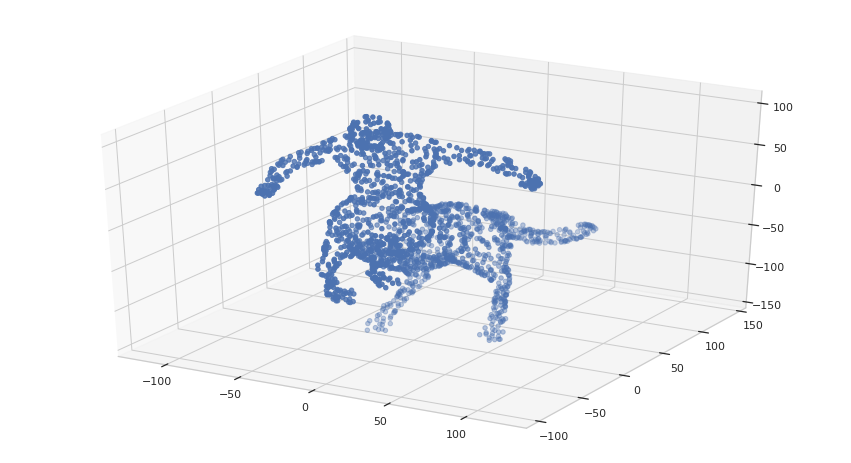

In [40]:
model3d_load("centaur",
             "/content/models/centaur1_final.ply")

In [144]:
model3d_load("bunny",
             "/content/models/bunny_final.ply")

array([[ -8.85583305,  26.17914963,  -3.57795548],
       [ 29.74560738,  26.10554886,  15.11982918],
       [-39.79079056,  25.78075027,  35.41494751],
       ...,
       [ 11.04216766,  54.63995743, -20.50729179],
       [-35.16022873,  43.69595718, -40.29809189],
       [-23.29655075,  34.25835037, -10.25094795]])

array([[-29.40551758, -33.2997551 ,  67.23104858],
       [-25.65196037, -39.60003281,  68.81466675],
       [-23.63307953, -36.93162155,  77.39789581],
       ...,
       [ 15.42198944,  90.70304871, -24.98669052],
       [ 15.36282635,  85.06995392, -25.89006615],
       [  8.28178215,  91.8428421 , -25.1983242 ]])

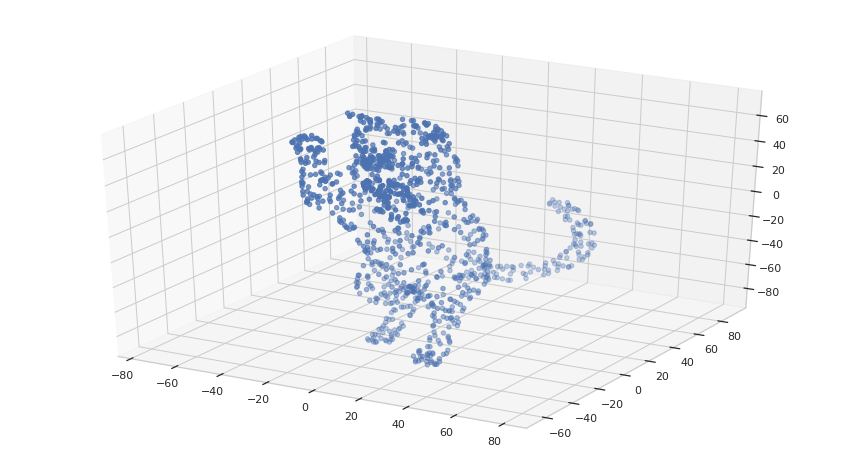

In [42]:
model3d_load("cat",
             "/content/models/cat1_final.ply")

array([[-19.7444973 ,  23.43611145, -22.91589355],
       [-12.24043655, -22.43489265,   4.4215579 ],
       [ 14.97439289,  14.9248333 , -42.47864151],
       ...,
       [-17.741045  ,  18.93567657, -26.60301971],
       [  5.66105318,  21.15514565, -45.60551453],
       [ -0.80088699,  34.47307968, -59.57435226]])

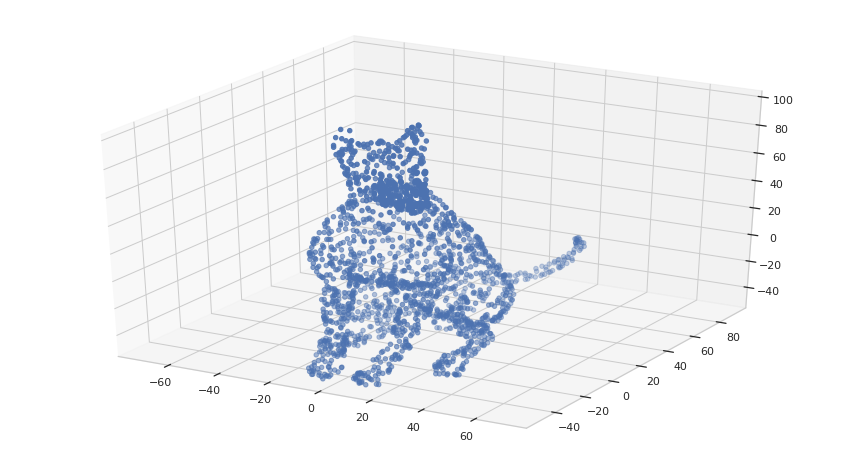

In [52]:
model3d_load("dog",
             "/content/models/dog7_final.ply")

In [145]:
model3d_load("trex",
             "/content/models/trex_final.ply")

array([[-43.74079132,  41.5028038 , -43.91464233],
       [-41.22035599,  45.59173203, -43.91317749],
       [-45.69956207,  37.06580734, -43.56332397],
       ...,
       [-10.69956398,  12.06580544,  44.21878052],
       [-21.69956398,   8.56580544,  44.68606567],
       [-19.19956398,  11.56580544,  44.76901245]])

#### m1-a

In [172]:
m1 = models["centaur"] 
m1 = np.vstack((m1, 
                models["cat"] + np.array([-150, 0, 0]),
                models["dog"] + np.array([0, -200, 0]),
                )
)

target = np.hstack((
    0*np.ones(len(models["centaur"])),
    1*np.ones(len(models["cat"])),
    2*np.ones(len(models["dog"])),
))


scatter3d_arr(m1, 
            # c=target,
            cmap=plt.cm.tab10)

##### cluster

In [173]:
clf = KMeans(n_clusters=3)

scatter3d_arr(m1, c=(clf.fit_predict(m1)), cmap=plt.cm.tab10)

In [149]:
clf = KMeans(n_clusters=6)

scatter3d_arr(m1, c=(clf.fit_predict(m1)), cmap=plt.cm.tab10)

In [150]:
clf = DBSCAN(eps=1)

scatter3d_arr(m1, c=(clf.fit_predict(m1)), cmap=plt.cm.tab10)

In [151]:
clf = DBSCAN(eps=4)

scatter3d_arr(m1, c=(clf.fit_predict(m1)), cmap=plt.cm.tab10)

In [174]:
clf = DBSCAN(eps=10)

scatter3d_arr(m1, c=(clf.fit_predict(m1)), cmap=plt.cm.tab10)

In [175]:
clf = Birch(n_clusters=3)

scatter3d_arr(m1, c=(clf.fit_predict(m1)), cmap=plt.cm.tab10)

In [154]:
clf = Birch(n_clusters=5)

scatter3d_arr(m1, c=(clf.fit_predict(m1)), cmap=plt.cm.tab10)

In [177]:
clf = HDBSCAN()

scatter3d_arr(m1, c=(clf.fit_predict(m1)), cmap=plt.cm.tab10)

In [176]:
clf = HDBSCAN(min_cluster_size=200)

scatter3d_arr(m1, c=(clf.fit_predict(m1)), cmap=plt.cm.tab10)

In [157]:
clf = HDBSCAN(min_cluster_size=200, cluster_selection_epsilon=200)

scatter3d_arr(m1, c=(clf.fit_predict(m1)), cmap=plt.cm.tab10)

In [158]:
clf = HDBSCAN(min_cluster_size=200, cluster_selection_epsilon=0.1)

scatter3d_arr(m1, c=(clf.fit_predict(m1)), cmap=plt.cm.tab10)

#### m1-b

In [159]:
m1 = models["centaur"] 
m1 = np.vstack((m1, 
                models["cat"] + np.array([-100, 0, 0]),
                models["dog"] + np.array([0, -100, 0]),
                )
)

target = np.hstack((
    0*np.ones(len(models["centaur"])),
    1*np.ones(len(models["cat"])),
    2*np.ones(len(models["dog"])),
))


scatter3d_arr(m1, 
              # c=target,
              cmap=plt.cm.tab10)
scatter3d_arr(m1, 
              c=target,
              cmap=plt.cm.tab10)

##### @duplicateCode cluster

In [160]:
clf = KMeans(n_clusters=3)

scatter3d_arr(m1, c=(clf.fit_predict(m1)), cmap=plt.cm.tab10)

In [161]:
clf = KMeans(n_clusters=6)

scatter3d_arr(m1, c=(clf.fit_predict(m1)), cmap=plt.cm.tab10)

In [162]:
clf = DBSCAN(eps=1)

scatter3d_arr(m1, c=(clf.fit_predict(m1)), cmap=plt.cm.tab10)

In [163]:
clf = DBSCAN(eps=4)

scatter3d_arr(m1, c=(clf.fit_predict(m1)), cmap=plt.cm.tab10)

In [164]:
clf = DBSCAN(eps=10)

scatter3d_arr(m1, c=(clf.fit_predict(m1)), cmap=plt.cm.tab10)

In [165]:
clf = Birch(n_clusters=3)

scatter3d_arr(m1, c=(clf.fit_predict(m1)), cmap=plt.cm.tab10)

In [166]:
clf = Birch(n_clusters=5)

scatter3d_arr(m1, c=(clf.fit_predict(m1)), cmap=plt.cm.tab10)

In [167]:
clf = HDBSCAN()

scatter3d_arr(m1, c=(clf.fit_predict(m1)), cmap=plt.cm.tab10)

In [168]:
clf = HDBSCAN(min_cluster_size=200)

scatter3d_arr(m1, c=(clf.fit_predict(m1)), cmap=plt.cm.tab10)

In [169]:
clf = HDBSCAN(min_cluster_size=200, cluster_selection_epsilon=200)

scatter3d_arr(m1, c=(clf.fit_predict(m1)), cmap=plt.cm.tab10)

In [170]:
clf = HDBSCAN(min_cluster_size=200, cluster_selection_epsilon=0.1)

scatter3d_arr(m1, c=(clf.fit_predict(m1)), cmap=plt.cm.tab10)

## Anime DB

### Load and transform

In [3]:
anime_df = pd.read_csv(anime_path)
anime_df.set_index('uid', inplace=True)
anime_df.head(10)

,title,synopsis,genre,aired,episodes,members,popularity,ranked,score,img_url,link
uid,,,,,,,,,,,
28891,Haikyuu!! Second Season,Following their participation at the Inter-Hig...,"['Comedy', 'Sports', 'Drama', 'School', 'Shoun...","Oct 4, 2015 to Mar 27, 2016",25.0,489888,141,25.0,8.82,https://cdn.myanimelist.net/images/anime/9/766...,https://myanimelist.net/anime/28891/Haikyuu_Se...
23273,Shigatsu wa Kimi no Uso,Music accompanies the path of the human metron...,"['Drama', 'Music', 'Romance', 'School', 'Shoun...","Oct 10, 2014 to Mar 20, 2015",22.0,995473,28,24.0,8.83,https://cdn.myanimelist.net/images/anime/3/671...,https://myanimelist.net/anime/23273/Shigatsu_w...
34599,Made in Abyss,The Abyss—a gaping chasm stretching down into ...,"['Sci-Fi', 'Adventure', 'Mystery', 'Drama', 'F...","Jul 7, 2017 to Sep 29, 2017",13.0,581663,98,23.0,8.83,https://cdn.myanimelist.net/images/anime/6/867...,https://myanimelist.net/anime/34599/Made_in_Abyss
5114,Fullmetal Alchemist: Brotherhood,"""In order for something to be obtained, someth...","['Action', 'Military', 'Adventure', 'Comedy', ...","Apr 5, 2009 to Jul 4, 2010",64.0,1615084,4,1.0,9.23,https://cdn.myanimelist.net/images/anime/1223/...,https://myanimelist.net/anime/5114/Fullmetal_A...
31758,Kizumonogatari III: Reiketsu-hen,After helping revive the legendary vampire Kis...,"['Action', 'Mystery', 'Supernatural', 'Vampire']","Jan 6, 2017",1.0,214621,502,22.0,8.83,https://cdn.myanimelist.net/images/anime/3/815...,https://myanimelist.net/anime/31758/Kizumonoga...
37510,Mob Psycho 100 II,"Shigeo ""Mob"" Kageyama is now maturing and unde...","['Action', 'Slice of Life', 'Comedy', 'Superna...","Jan 7, 2019 to Apr 1, 2019",13.0,442310,176,21.0,8.89,https://cdn.myanimelist.net/images/anime/1918/...,https://myanimelist.net/anime/37510/Mob_Psycho...
199,Sen to Chihiro no Kamikakushi,"Stubborn, spoiled, and naïve, 10-year-old Chih...","['Adventure', 'Supernatural', 'Drama']","Jul 20, 2001",1.0,913212,40,20.0,8.90,https://cdn.myanimelist.net/images/anime/6/795...,https://myanimelist.net/anime/199/Sen_to_Chihi...
38000,Kimetsu no Yaiba,"Ever since the death of his father, the burden...","['Action', 'Demons', 'Historical', 'Shounen', ...","Apr 6, 2019 to Sep 28, 2019",26.0,575037,106,19.0,8.92,https://cdn.myanimelist.net/images/anime/1286/...,https://myanimelist.net/anime/38000/Kimetsu_no...
35247,Owarimonogatari 2nd Season,Following an encounter with oddity specialist ...,"['Mystery', 'Comedy', 'Supernatural', 'Vampire']","Aug 12, 2017 to Aug 13, 2017",7.0,189944,573,18.0,8.93,https://cdn.myanimelist.net/images/anime/6/873...,https://myanimelist.net/anime/35247/Owarimonog...


In [4]:
anime_df.loc[1]

,title,synopsis,genre,aired,episodes,members,popularity,ranked,score,img_url,link
uid,,,,,,,,,,,
1,Cowboy Bebop,"In the year 2071, humanity has colonized sever...","['Action', 'Adventure', 'Comedy', 'Drama', 'Sc...","Apr 3, 1998 to Apr 24, 1999",26.0,930311,39,26.0,8.81,https://cdn.myanimelist.net/images/anime/4/196...,https://myanimelist.net/anime/1/Cowboy_Bebop
1,Cowboy Bebop,"In the year 2071, humanity has colonized sever...","['Action', 'Adventure', 'Comedy', 'Drama', 'Sc...","Apr 3, 1998 to Apr 24, 1999",26.0,930311,39,26.0,8.81,https://cdn.myanimelist.net/images/anime/4/196...,https://myanimelist.net/anime/1/Cowboy_Bebop


In [5]:
anime_df = anime_df[~anime_df.index.duplicated(keep='first')]

In [6]:
anime_df.loc[1]

title                                              Cowboy Bebop
synopsis      In the year 2071, humanity has colonized sever...
genre         ['Action', 'Adventure', 'Comedy', 'Drama', 'Sc...
aired                               Apr 3, 1998 to Apr 24, 1999
episodes                                                   26.0
members                                                  930311
popularity                                                   39
ranked                                                     26.0
score                                                      8.81
img_url       https://cdn.myanimelist.net/images/anime/4/196...
link               https://myanimelist.net/anime/1/Cowboy_Bebop
Name: 1, dtype: object

In [7]:
reviews_df = pd.read_csv(reviews_path)
reviews_df.head(10)

,uid,profile,anime_uid,text,score,scores,link
0,255938,DesolatePsyche,34096,\n \n \n \n ...,8,"{'Overall': '8', 'Story': '8', 'Animation': '8...",https://myanimelist.net/reviews.php?id=255938
1,259117,baekbeans,34599,\n \n \n \n ...,10,"{'Overall': '10', 'Story': '10', 'Animation': ...",https://myanimelist.net/reviews.php?id=259117
2,253664,skrn,28891,\n \n \n \n ...,7,"{'Overall': '7', 'Story': '7', 'Animation': '9...",https://myanimelist.net/reviews.php?id=253664
3,8254,edgewalker00,2904,\n \n \n \n ...,9,"{'Overall': '9', 'Story': '9', 'Animation': '9...",https://myanimelist.net/reviews.php?id=8254
4,291149,aManOfCulture99,4181,\n \n \n \n ...,10,"{'Overall': '10', 'Story': '10', 'Animation': ...",https://myanimelist.net/reviews.php?id=291149
5,10046,eneri,2904,\n \n \n \n ...,10,"{'Overall': '10', 'Story': '9', 'Animation': '...",https://myanimelist.net/reviews.php?id=10046
6,247454,Waffle_Empress,16664,\n \n \n \n ...,6,"{'Overall': '6', 'Story': '6', 'Animation': '9...",https://myanimelist.net/reviews.php?id=247454
7,140903,NIGGER_BONER,2904,\n \n \n \n ...,8,"{'Overall': '8', 'Story': '7', 'Animation': '9...",https://myanimelist.net/reviews.php?id=140903
8,23791,jchang,2904,\n \n \n \n ...,10,"{'Overall': '10', 'Story': '10', 'Animation': ...",https://myanimelist.net/reviews.php?id=23791
9,25115,shadowsplat,4181,\n \n \n \n ...,4,"{'Overall': '4', 'Story': '8', 'Animation': '9...",https://myanimelist.net/reviews.php?id=25115


In [8]:
reviews_pivoted = reviews_df.pivot_table(
    index='anime_uid',
    columns='profile',
    values='score',
    aggfunc=np.mean)
reviews_pivoted.head(10)

profile,-----noname-----,---SnowFlake---,---was-----,--EYEPATCH--,--Mizu--,--Sunclaudius,--animeislife--,--d41,--mimika--,--skeletor--,...,zz980718,zzSorazz,zzeroparticle,zzs,zzxcvb,zzyamuraihazz,zzz-anime,zzzb,zzzjynne,zzzzzzzz
anime_uid,,,,,,,,,,,,,,,,,,,,,
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
from sklearn.impute import SimpleImputer

#: SimpleImputer seems to have some memory bugs.

if False:
  imp = SimpleImputer(missing_values=np.nan, strategy='mean')
  reviews_pivoted_nonan = imp.fit_transform(reviews_pivoted)
  #: Your session crashed after using all available RAM. 

  reviews_pivoted_nonan.head(20)
elif False:
  imp = SimpleImputer(missing_values=np.nan, strategy='constant', fill_value=6)
  reviews_pivoted_nonan = imp.fit_transform(reviews_pivoted)
  #: Your session crashed after using all available RAM. 

  reviews_pivoted_nonan.head(20)
elif False:
  imp = SimpleImputer(missing_values=np.nan, strategy='mean')
  reviews_np_hat2 = imp.fit_transform(reviews_np)
  reviews_np_hat2

In [10]:
reviews_np = reviews_pivoted.to_numpy()
reviews_np

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

In [11]:
reviews_np.shape

(8113, 47885)

In [12]:
#: To avoid memory issues (not needed with dask):

# reviews_np = reviews_np[:, :10000]

In [13]:
#: Replacing NaNs by their column mean

missing = ~np.isfinite(reviews_np)
mu = np.nanmean(reviews_np, 0, keepdims=1)
reviews_np_hat = np.where(missing, mu, reviews_np)
reviews_np_hat

array([[ 3. ,  6. ,  8. , ...,  8. ,  7.5, 10. ],
       [ 3. ,  6. ,  8. , ...,  8. ,  7.5, 10. ],
       [ 3. ,  6. ,  8. , ...,  8. ,  7.5, 10. ],
       ...,
       [ 3. ,  6. ,  8. , ...,  8. ,  7.5, 10. ],
       [ 3. ,  6. ,  8. , ...,  8. ,  7.5, 10. ],
       [ 3. ,  6. ,  8. , ...,  8. ,  7.5, 10. ]])

In [14]:
reviews_np_hat.shape

(8113, 47885)

### Cluster

In [19]:
# clf = KMeans(n_clusters=10)
#: Your session crashed after using all available RAM.
##
dask_p = True

if dask_p:
  clf = dask_ml.cluster.KMeans(n_clusters=10)
else:
  batch_size = 2**10
  clf = MiniBatchKMeans(
      batch_size=batch_size,
      compute_labels=True,
      # max_no_improvement=10,
  )
##
clf.fit(reviews_np_hat)
reviews_clustered = clf.predict(reviews_np_hat)

if dask_p:
  reviews_clustered = reviews_clustered.compute()

In [22]:
reviews_clustered

array([9, 1, 1, ..., 1, 1, 1], dtype=int32)

In [23]:
##
# reviews_clustered_df = reviews_pivoted.reset_index(inplace=True) #: inplace to avoid RAM issues
##
reviews_clustered_df = pd.DataFrame(index=reviews_pivoted.index)
##
reviews_clustered_df['cluster'] = reviews_clustered
# reviews_clustered_df = reviews_clustered_df.loc[:, ['anime_uid', 'cluster']]
reviews_clustered_df.head(20)

,cluster
anime_uid,
1,9
5,1
6,1
7,1
8,1
15,1
16,1
17,1
18,1


In [24]:
reviews_clustered_joined = reviews_clustered_df.join(anime_df, how='inner', on='anime_uid')

reviews_clustered_joined.head(10)

,cluster,title,synopsis,genre,aired,episodes,members,popularity,ranked,score,img_url,link
anime_uid,,,,,,,,,,,,
1,9,Cowboy Bebop,"In the year 2071, humanity has colonized sever...","['Action', 'Adventure', 'Comedy', 'Drama', 'Sc...","Apr 3, 1998 to Apr 24, 1999",26.0,930311,39,26.0,8.81,https://cdn.myanimelist.net/images/anime/4/196...,https://myanimelist.net/anime/1/Cowboy_Bebop
5,1,Cowboy Bebop: Tengoku no Tobira,"Another day, another bounty—such is the life o...","['Action', 'Drama', 'Mystery', 'Sci-Fi', 'Space']","Sep 1, 2001",1.0,223199,475,149.0,8.40,https://cdn.myanimelist.net/images/anime/1439/...,https://myanimelist.net/anime/5/Cowboy_Bebop__...
6,1,Trigun,"Vash the Stampede is the man with a $$60,000,0...","['Action', 'Sci-Fi', 'Adventure', 'Comedy', 'D...","Apr 1, 1998 to Sep 30, 1998",26.0,460146,158,256.0,8.28,https://cdn.myanimelist.net/images/anime/7/203...,https://myanimelist.net/anime/6/Trigun
7,1,Witch Hunter Robin,Witches are individuals with special powers li...,"['Action', 'Magic', 'Police', 'Supernatural', ...","Jul 2, 2002 to Dec 24, 2002",26.0,85182,1278,2487.0,7.32,https://cdn.myanimelist.net/images/anime/1796/...,https://myanimelist.net/anime/7/Witch_Hunter_R...
8,1,Bouken Ou Beet,It is the dark century and the people are suff...,"['Adventure', 'Fantasy', 'Shounen', 'Supernatu...","Sep 30, 2004 to Sep 29, 2005",52.0,12319,3968,3704.0,7.02,https://cdn.myanimelist.net/images/anime/7/215...,https://myanimelist.net/anime/8/Bouken_Ou_Beet
15,1,Eyeshield 21,Sena is like any other shy kid starting high s...,"['Action', 'Sports', 'Comedy', 'Shounen']","Apr 6, 2005 to Mar 19, 2008",145.0,126760,888,542.0,8.02,https://cdn.myanimelist.net/images/anime/12/66...,https://myanimelist.net/anime/15/Eyeshield_21
16,1,Hachimitsu to Clover,"Yuuta, Takumi, and Shinobu share a six-tatami ...","['Comedy', 'Drama', 'Josei', 'Romance', 'Slice...","Apr 15, 2005 to Sep 27, 2005",24.0,186696,578,436.0,8.11,https://cdn.myanimelist.net/images/anime/11/73...,https://myanimelist.net/anime/16/Hachimitsu_to...
17,1,Hungry Heart: Wild Striker,Kyosuke Kano has lived under the shadow of his...,"['Slice of Life', 'Comedy', 'Sports', 'Shounen']","Sep 11, 2002 to Sep 10, 2003",52.0,18370,3330,1273.0,7.65,https://cdn.myanimelist.net/images/anime/12/49...,https://myanimelist.net/anime/17/Hungry_Heart_...
18,1,Initial D Fourth Stage,Takumi Fujiwara and brothers Keisuke and Ryous...,"['Action', 'Cars', 'Sports', 'Drama', 'Seinen']","Apr 17, 2004 to Feb 18, 2006",24.0,87746,1228,336.0,8.18,https://cdn.myanimelist.net/images/anime/12/43...,https://myanimelist.net/anime/18/Initial_D_Fou...


In [25]:
def show_cluster(cluster=1):
  df = reviews_clustered_joined.loc[
         reviews_clustered_joined['cluster'] == cluster]

  df.sort_values(by='ranked')

  print(df.shape)
  
  return df.head(20)

#### results

In [26]:
show_cluster(1)

(8104, 12)


,cluster,title,synopsis,genre,aired,episodes,members,popularity,ranked,score,img_url,link
anime_uid,,,,,,,,,,,,
5,1,Cowboy Bebop: Tengoku no Tobira,"Another day, another bounty—such is the life o...","['Action', 'Drama', 'Mystery', 'Sci-Fi', 'Space']","Sep 1, 2001",1.0,223199,475,149.0,8.40,https://cdn.myanimelist.net/images/anime/1439/...,https://myanimelist.net/anime/5/Cowboy_Bebop__...
6,1,Trigun,"Vash the Stampede is the man with a $$60,000,0...","['Action', 'Sci-Fi', 'Adventure', 'Comedy', 'D...","Apr 1, 1998 to Sep 30, 1998",26.0,460146,158,256.0,8.28,https://cdn.myanimelist.net/images/anime/7/203...,https://myanimelist.net/anime/6/Trigun
7,1,Witch Hunter Robin,Witches are individuals with special powers li...,"['Action', 'Magic', 'Police', 'Supernatural', ...","Jul 2, 2002 to Dec 24, 2002",26.0,85182,1278,2487.0,7.32,https://cdn.myanimelist.net/images/anime/1796/...,https://myanimelist.net/anime/7/Witch_Hunter_R...
8,1,Bouken Ou Beet,It is the dark century and the people are suff...,"['Adventure', 'Fantasy', 'Shounen', 'Supernatu...","Sep 30, 2004 to Sep 29, 2005",52.0,12319,3968,3704.0,7.02,https://cdn.myanimelist.net/images/anime/7/215...,https://myanimelist.net/anime/8/Bouken_Ou_Beet
15,1,Eyeshield 21,Sena is like any other shy kid starting high s...,"['Action', 'Sports', 'Comedy', 'Shounen']","Apr 6, 2005 to Mar 19, 2008",145.0,126760,888,542.0,8.02,https://cdn.myanimelist.net/images/anime/12/66...,https://myanimelist.net/anime/15/Eyeshield_21
16,1,Hachimitsu to Clover,"Yuuta, Takumi, and Shinobu share a six-tatami ...","['Comedy', 'Drama', 'Josei', 'Romance', 'Slice...","Apr 15, 2005 to Sep 27, 2005",24.0,186696,578,436.0,8.11,https://cdn.myanimelist.net/images/anime/11/73...,https://myanimelist.net/anime/16/Hachimitsu_to...
17,1,Hungry Heart: Wild Striker,Kyosuke Kano has lived under the shadow of his...,"['Slice of Life', 'Comedy', 'Sports', 'Shounen']","Sep 11, 2002 to Sep 10, 2003",52.0,18370,3330,1273.0,7.65,https://cdn.myanimelist.net/images/anime/12/49...,https://myanimelist.net/anime/17/Hungry_Heart_...
18,1,Initial D Fourth Stage,Takumi Fujiwara and brothers Keisuke and Ryous...,"['Action', 'Cars', 'Sports', 'Drama', 'Seinen']","Apr 17, 2004 to Feb 18, 2006",24.0,87746,1228,336.0,8.18,https://cdn.myanimelist.net/images/anime/12/43...,https://myanimelist.net/anime/18/Initial_D_Fou...
19,1,Monster,"Dr. Kenzou Tenma, an elite neurosurgeon recent...","['Drama', 'Horror', 'Mystery', 'Police', 'Psyc...","Apr 7, 2004 to Sep 28, 2005",74.0,459710,159,46.0,8.69,https://cdn.myanimelist.net/images/anime/10/18...,https://myanimelist.net/anime/19/Monster


In [27]:
show_cluster(2)

(1, 12)


,cluster,title,synopsis,genre,aired,episodes,members,popularity,ranked,score,img_url,link
anime_uid,,,,,,,,,,,,
35849,2,Darling in the FranXX,"In the distant future, humanity has been drive...","['Action', 'Drama', 'Mecha', 'Romance', 'Sci-Fi']","Jan 13, 2018 to Jul 7, 2018",24.0,580308,100,1819.0,7.47,https://cdn.myanimelist.net/images/anime/1614/...,https://myanimelist.net/anime/35849/Darling_in...


In [28]:
show_cluster(3)

(1, 12)


,cluster,title,synopsis,genre,aired,episodes,members,popularity,ranked,score,img_url,link
anime_uid,,,,,,,,,,,,
4224,3,Toradora!,Ryuuji Takasu is a gentle high school student ...,"['Slice of Life', 'Comedy', 'Romance', 'School']","Oct 2, 2008 to Mar 26, 2009",25.0,1153720,14,204.0,8.34,https://cdn.myanimelist.net/images/anime/13/22...,https://myanimelist.net/anime/4224/Toradora


In [29]:
show_cluster(4)

(1, 12)


,cluster,title,synopsis,genre,aired,episodes,members,popularity,ranked,score,img_url,link
anime_uid,,,,,,,,,,,,
36882,4,Arifureta Shokugyou de Sekai Saikyou,The ordinary life of 17-year-old otaku Hajime ...,"['Action', 'Adventure', 'Fantasy', 'Harem']","Jul 8, 2019 to Oct 7, 2019",13.0,192308,561,5901.0,6.53,https://cdn.myanimelist.net/images/anime/1799/...,https://myanimelist.net/anime/36882/Arifureta_...


In [30]:
show_cluster(5)

(1, 12)


,cluster,title,synopsis,genre,aired,episodes,members,popularity,ranked,score,img_url,link
anime_uid,,,,,,,,,,,,
30276,5,One Punch Man,The seemingly ordinary and unimpressive Saitam...,"['Action', 'Sci-Fi', 'Comedy', 'Parody', 'Supe...","Oct 5, 2015 to Dec 21, 2015",12.0,1475219,5,50.0,8.68,https://cdn.myanimelist.net/images/anime/12/76...,https://myanimelist.net/anime/30276/One_Punch_Man


In [31]:
show_cluster(6)

(1, 12)


,cluster,title,synopsis,genre,aired,episodes,members,popularity,ranked,score,img_url,link
anime_uid,,,,,,,,,,,,
10793,6,Guilty Crown,"Japan, 2039. Ten years after the outbreak of t...","['Action', 'Sci-Fi', 'Super Power', 'Drama', '...","Oct 14, 2011 to Mar 23, 2012",22.0,781239,57,1271.0,7.65,https://cdn.myanimelist.net/images/anime/8/337...,https://myanimelist.net/anime/10793/Guilty_Crown


In [32]:
show_cluster(7)

(1, 12)


,cluster,title,synopsis,genre,aired,episodes,members,popularity,ranked,score,img_url,link
anime_uid,,,,,,,,,,,,
20785,7,Mahouka Koukou no Rettousei,"In the dawn of the 21st century, magic, long t...","['Action', 'Sci-Fi', 'Supernatural', 'Magic', ...","Apr 6, 2014 to Sep 28, 2014",26.0,567267,105,1198.0,7.68,https://cdn.myanimelist.net/images/anime/11/61...,https://myanimelist.net/anime/20785/Mahouka_Ko...


In [33]:
show_cluster(8)

(1, 12)


,cluster,title,synopsis,genre,aired,episodes,members,popularity,ranked,score,img_url,link
anime_uid,,,,,,,,,,,,
32949,8,Kuzu no Honkai,"To the outside world, Hanabi Yasuraoka and Mug...","['Drama', 'Romance', 'School', 'Seinen']","Jan 13, 2017 to Mar 31, 2017",12.0,338033,287,1906.0,7.45,https://cdn.myanimelist.net/images/anime/5/839...,https://myanimelist.net/anime/32949/Kuzu_no_Ho...


In [34]:
show_cluster(9)

(1, 12)


,cluster,title,synopsis,genre,aired,episodes,members,popularity,ranked,score,img_url,link
anime_uid,,,,,,,,,,,,
1,9,Cowboy Bebop,"In the year 2071, humanity has colonized sever...","['Action', 'Adventure', 'Comedy', 'Drama', 'Sc...","Apr 3, 1998 to Apr 24, 1999",26.0,930311,39,26.0,8.81,https://cdn.myanimelist.net/images/anime/4/196...,https://myanimelist.net/anime/1/Cowboy_Bebop


In [35]:
show_cluster(10)

(0, 12)


,cluster,title,synopsis,genre,aired,episodes,members,popularity,ranked,score,img_url,link
anime_uid,,,,,,,,,,,,


### visualizations

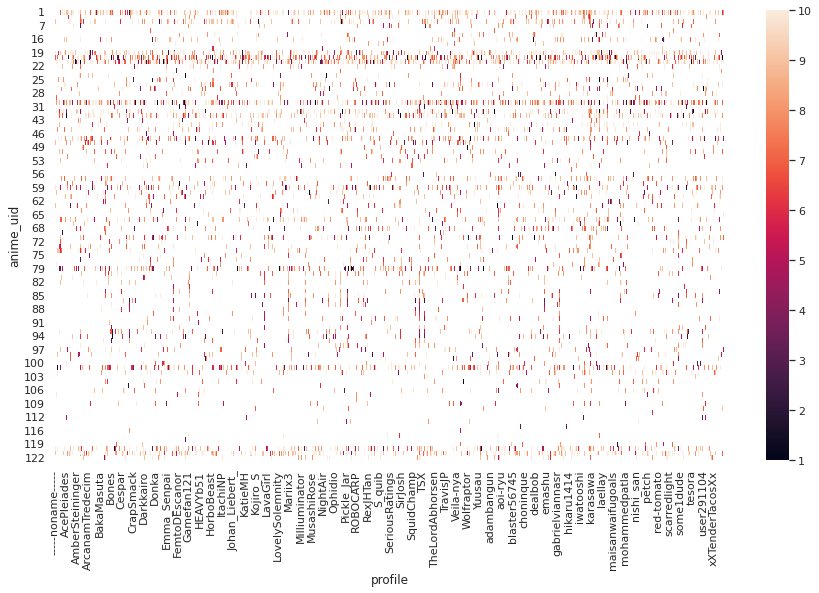

In [13]:
sns.heatmap(reviews_pivoted.head(100))
#: can cause out-of-memory with bigger sizes

## imdb_250_movies

### load

In [133]:
imdb_250_movies = pd.read_csv(imdb_250_movies_path)

imdb_250_movies.rename(inplace=True,
    columns={
        'DIRECTOR ': 'director',
        'ranking of movie': 'rank',
        'movie name ': 'name'
    }
)

imdb_250_movies.set_index('rank', inplace=True)

imdb_250_movies['Year'] = -(pd.to_numeric(imdb_250_movies.Year, errors='coerce').fillna(0).astype(np.int64))

imdb_250_movies.runtime.replace(
    regex=True,
    inplace=True,
    to_replace=r'\s*(\d+)\s*mins?\s*',
    value=r'\1',
)
imdb_250_movies.runtime = (pd.to_numeric(imdb_250_movies.runtime, errors='coerce').fillna(0).astype(np.int64))

imdb_250_movies.genre = imdb_250_movies.genre.str.split(pat=r'\s*,\s*')

print(imdb_250_movies.dtypes)

imdb_250_movies_1hot = imdb_250_movies

imdb_250_movies.head(3)

name                   object
Year                    int64
certificate            object
runtime                 int64
genre                  object
RATING                float64
DETAIL ABOUT MOVIE     object
director               object
ACTOR 1                object
ACTOR 2                object
ACTOR 3                object
ACTOR 4                object
votes                   int64
metascore             float64
GROSS COLLECTION       object
dtype: object


,name,Year,certificate,runtime,genre,RATING,DETAIL ABOUT MOVIE,director,ACTOR 1,ACTOR 2,ACTOR 3,ACTOR 4,votes,metascore,GROSS COLLECTION
rank,,,,,,,,,,,,,,,
1,Jai Bhim,2021,TV-MA,164,"[Crime, Drama]",9.4,When a tribal man is arrested for a case of al...,T.J. Gnanavel,Suriya,Lijo Mol Jose,Manikandan,Rajisha Vijayan,163431,NaN,NaN
2,The Shawshank Redemption,1994,R,142,[Drama],9.3,Two imprisoned men bond over a number of years...,Frank Darabont,Tim Robbins,Morgan Freeman,Bob Gunton,William Sadler,2515762,80.0,$28.34M
3,The Godfather,1972,R,175,"[Crime, Drama]",9.2,"The Godfather follows Vito Corleone, Don of th...",Francis Ford Coppola,Marlon Brando,Al Pacino,James Caan,Diane Keaton,1732749,100.0,$134.97M


In [134]:
print(imdb_250_movies.columns)

Index(['name', 'Year', 'certificate', 'runtime', 'genre', 'RATING',
       'DETAIL ABOUT MOVIE', 'director', 'ACTOR 1', 'ACTOR 2', 'ACTOR 3',
       'ACTOR 4', 'votes', 'metascore', 'GROSS COLLECTION'],
      dtype='object')


In [135]:
from sklearn.preprocessing import MultiLabelBinarizer


genres_mlb = MultiLabelBinarizer()
genres_mlb.fit(imdb_250_movies_1hot.genre)
genres_cols = ["genre_%s" % c.strip() for c in genres_mlb.classes_]
print(len(genres_cols))
print(genres_cols)
genres_1hot_np = genres_mlb.transform(imdb_250_movies_1hot.genre)
# print(genres_1hot_np)
genres_1hot = pd.DataFrame(genres_1hot_np, columns=genres_cols, index=imdb_250_movies_1hot.index)
display(genres_1hot.head(10))

imdb_250_movies_1hot = imdb_250_movies_1hot.join(genres_1hot)

imdb_250_movies_1hot.head(10)

21
['genre_Action', 'genre_Adventure', 'genre_Animation', 'genre_Biography', 'genre_Comedy', 'genre_Crime', 'genre_Drama', 'genre_Family', 'genre_Fantasy', 'genre_Film-Noir', 'genre_History', 'genre_Horror', 'genre_Music', 'genre_Musical', 'genre_Mystery', 'genre_Romance', 'genre_Sci-Fi', 'genre_Sport', 'genre_Thriller', 'genre_War', 'genre_Western']


,genre_Action,genre_Adventure,genre_Animation,genre_Biography,genre_Comedy,genre_Crime,genre_Drama,genre_Family,genre_Fantasy,genre_Film-Noir,...,genre_Horror,genre_Music,genre_Musical,genre_Mystery,genre_Romance,genre_Sci-Fi,genre_Sport,genre_Thriller,genre_War,genre_Western
rank,,,,,,,,,,,,,,,,,,,,,
1,0,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


,name,Year,certificate,runtime,genre,RATING,DETAIL ABOUT MOVIE,director,ACTOR 1,ACTOR 2,...,genre_Horror,genre_Music,genre_Musical,genre_Mystery,genre_Romance,genre_Sci-Fi,genre_Sport,genre_Thriller,genre_War,genre_Western
rank,,,,,,,,,,,,,,,,,,,,,
1,Jai Bhim,2021,TV-MA,164,"[Crime, Drama]",9.4,When a tribal man is arrested for a case of al...,T.J. Gnanavel,Suriya,Lijo Mol Jose,...,0,0,0,0,0,0,0,0,0,0
2,The Shawshank Redemption,1994,R,142,[Drama],9.3,Two imprisoned men bond over a number of years...,Frank Darabont,Tim Robbins,Morgan Freeman,...,0,0,0,0,0,0,0,0,0,0
3,The Godfather,1972,R,175,"[Crime, Drama]",9.2,"The Godfather follows Vito Corleone, Don of th...",Francis Ford Coppola,Marlon Brando,Al Pacino,...,0,0,0,0,0,0,0,0,0,0
4,The Dark Knight,2008,PG-13,152,"[Action, Crime, Drama]",9.0,When the menace known as the Joker wreaks havo...,Christopher Nolan,Christian Bale,Heath Ledger,...,0,0,0,0,0,0,0,0,0,0
5,The Godfather: Part II,1974,R,202,"[Crime, Drama]",9.0,The early life and career of Vito Corleone in ...,Francis Ford Coppola,Al Pacino,Robert De Niro,...,0,0,0,0,0,0,0,0,0,0
6,12 Angry Men,1957,Approved,96,"[Crime, Drama]",9.0,The jury in a New York City murder trial is fr...,Sidney Lumet,Henry Fonda,Lee J. Cobb,...,0,0,0,0,0,0,0,0,0,0
7,The Lord of the Rings: The Return of the King,2003,PG-13,201,"[Action, Adventure, Drama]",8.9,Gandalf and Aragorn lead the World of Men agai...,Peter Jackson,Elijah Wood,Viggo Mortensen,...,0,0,0,0,0,0,0,0,0,0
8,Pulp Fiction,1994,R,154,"[Crime, Drama]",8.9,"The lives of two mob hitmen, a boxer, a gangst...",Quentin Tarantino,John Travolta,Uma Thurman,...,0,0,0,0,0,0,0,0,0,0
9,Schindler's List,1993,R,195,"[Biography, Drama, History]",8.9,"In German-occupied Poland during World War II,...",Steven Spielberg,Liam Neeson,Ralph Fiennes,...,0,0,0,0,0,0,0,0,0,0


In [136]:
actor_cols_old = [('ACTOR %d' % i) for i in range(1,5)]
actors = imdb_250_movies_1hot[actor_cols_old]
##
imdb_250_movies_1hot['actors'] = actors.values.tolist()
imdb_250_movies_1hot.head(3)

,name,Year,certificate,runtime,genre,RATING,DETAIL ABOUT MOVIE,director,ACTOR 1,ACTOR 2,...,genre_Music,genre_Musical,genre_Mystery,genre_Romance,genre_Sci-Fi,genre_Sport,genre_Thriller,genre_War,genre_Western,actors
rank,,,,,,,,,,,,,,,,,,,,,
1,Jai Bhim,2021,TV-MA,164,"[Crime, Drama]",9.4,When a tribal man is arrested for a case of al...,T.J. Gnanavel,Suriya,Lijo Mol Jose,...,0,0,0,0,0,0,0,0,0,"[Suriya, Lijo Mol Jose, Manikandan, Rajisha Vi..."
2,The Shawshank Redemption,1994,R,142,[Drama],9.3,Two imprisoned men bond over a number of years...,Frank Darabont,Tim Robbins,Morgan Freeman,...,0,0,0,0,0,0,0,0,0,"[Tim Robbins, Morgan Freeman, Bob Gunton, Will..."
3,The Godfather,1972,R,175,"[Crime, Drama]",9.2,"The Godfather follows Vito Corleone, Don of th...",Francis Ford Coppola,Marlon Brando,Al Pacino,...,0,0,0,0,0,0,0,0,0,"[Marlon Brando, Al Pacino, James Caan, Diane K..."


In [137]:
actors_mlb = MultiLabelBinarizer()
actors_mlb.fit(imdb_250_movies_1hot.actors)
actors_cols = ["actor_%s" % c.strip() for c in actors_mlb.classes_]
print(len(actors_cols))
print(actors_cols)
actors_1hot_np = actors_mlb.transform(imdb_250_movies_1hot.actors)
# print(actors_1hot_np)
actors_1hot = pd.DataFrame(actors_1hot_np, columns=actors_cols, index=imdb_250_movies_1hot.index)
display(actors_1hot.head(10))

imdb_250_movies_1hot = imdb_250_movies_1hot.join(actors_1hot)

imdb_250_movies_1hot.head(3)

802
['actor_Aamir Khan', 'actor_Aaron Eckhart', 'actor_Abdel Ahmed Ghili', 'actor_Adam Baldwin', 'actor_Adolphe Menjou', 'actor_Adrian Molina', 'actor_Adrien Brody', 'actor_Agnes Moorehead', 'actor_Ahney Her', 'actor_Akemi Yamaguchi', 'actor_Akihiro Miwa', 'actor_Akira Ishihama', 'actor_Akira Terao', 'actor_Al Pacino', 'actor_Alan Rickman', 'actor_Albert Brooks', 'actor_Albert Rémy', 'actor_Aldo Giuffrè', 'actor_Alec Guinness', 'actor_Aleksandr Kaydanovskiy', 'actor_Aleksey Kravchenko', 'actor_Alexander Gould', 'actor_Alexandra Maria Lara', 'actor_Alexandre Rodrigues', 'actor_Alfred Abel', 'actor_Alida Valli', 'actor_Alisa Freyndlikh', 'actor_Alison Crosbie', 'actor_Alison Doody', 'actor_Amir Farrokh Hashemian', 'actor_Amole Gupte', 'actor_Amy Poehler', 'actor_Anatoliy Solonitsyn', 'actor_Andrea Eckert', 'actor_Andrew Garfield', 'actor_Andrew Kevin Walker', 'actor_André Berley', 'actor_Angus Macfadyen', 'actor_Anil Dhawan', 'actor_Anne Bancroft', 'actor_Anne Baxter', 'actor_Anne Hathaw

,actor_Aamir Khan,actor_Aaron Eckhart,actor_Abdel Ahmed Ghili,actor_Adam Baldwin,actor_Adolphe Menjou,actor_Adrian Molina,actor_Adrien Brody,actor_Agnes Moorehead,actor_Ahney Her,actor_Akemi Yamaguchi,...,actor_Yûko Miyamura,actor_Yûko Tanaka,actor_Zach Grenier,actor_Zain Al Rafeea,actor_Zazie Beetz,actor_Zendaya,actor_Zoë Kravitz,actor_Álvaro Guerrero,actor_Çetin Tekindor,actor_Éric Toledano
rank,,,,,,,,,,,,,,,,,,,,,
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


,name,Year,certificate,runtime,genre,RATING,DETAIL ABOUT MOVIE,director,ACTOR 1,ACTOR 2,...,actor_Yûko Miyamura,actor_Yûko Tanaka,actor_Zach Grenier,actor_Zain Al Rafeea,actor_Zazie Beetz,actor_Zendaya,actor_Zoë Kravitz,actor_Álvaro Guerrero,actor_Çetin Tekindor,actor_Éric Toledano
rank,,,,,,,,,,,,,,,,,,,,,
1,Jai Bhim,2021,TV-MA,164,"[Crime, Drama]",9.4,When a tribal man is arrested for a case of al...,T.J. Gnanavel,Suriya,Lijo Mol Jose,...,0,0,0,0,0,0,0,0,0,0
2,The Shawshank Redemption,1994,R,142,[Drama],9.3,Two imprisoned men bond over a number of years...,Frank Darabont,Tim Robbins,Morgan Freeman,...,0,0,0,0,0,0,0,0,0,0
3,The Godfather,1972,R,175,"[Crime, Drama]",9.2,"The Godfather follows Vito Corleone, Don of th...",Francis Ford Coppola,Marlon Brando,Al Pacino,...,0,0,0,0,0,0,0,0,0,0


In [138]:
imdb_250_movies_1hot = pd.get_dummies(
    imdb_250_movies_1hot,
    prefix=['age_rating',
            'director',
            ],
    columns=['certificate',
             'director',
             ],
)

imdb_250_movies_1hot.head(10)

,name,Year,runtime,genre,RATING,DETAIL ABOUT MOVIE,ACTOR 1,ACTOR 2,ACTOR 3,ACTOR 4,...,director_Tom McCarthy,director_Tony Kaye,director_Victor Fleming,director_Vittorio De Sica,director_Wes Anderson,director_William Wyler,director_Wim Wenders,director_Wolfgang Petersen,director_Yasujirô Ozu,director_Yavuz Turgul
rank,,,,,,,,,,,,,,,,,,,,,
1,Jai Bhim,2021,164,"[Crime, Drama]",9.4,When a tribal man is arrested for a case of al...,Suriya,Lijo Mol Jose,Manikandan,Rajisha Vijayan,...,0,0,0,0,0,0,0,0,0,0
2,The Shawshank Redemption,1994,142,[Drama],9.3,Two imprisoned men bond over a number of years...,Tim Robbins,Morgan Freeman,Bob Gunton,William Sadler,...,0,0,0,0,0,0,0,0,0,0
3,The Godfather,1972,175,"[Crime, Drama]",9.2,"The Godfather follows Vito Corleone, Don of th...",Marlon Brando,Al Pacino,James Caan,Diane Keaton,...,0,0,0,0,0,0,0,0,0,0
4,The Dark Knight,2008,152,"[Action, Crime, Drama]",9.0,When the menace known as the Joker wreaks havo...,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,...,0,0,0,0,0,0,0,0,0,0
5,The Godfather: Part II,1974,202,"[Crime, Drama]",9.0,The early life and career of Vito Corleone in ...,Al Pacino,Robert De Niro,Robert Duvall,Diane Keaton,...,0,0,0,0,0,0,0,0,0,0
6,12 Angry Men,1957,96,"[Crime, Drama]",9.0,The jury in a New York City murder trial is fr...,Henry Fonda,Lee J. Cobb,Martin Balsam,John Fiedler,...,0,0,0,0,0,0,0,0,0,0
7,The Lord of the Rings: The Return of the King,2003,201,"[Action, Adventure, Drama]",8.9,Gandalf and Aragorn lead the World of Men agai...,Elijah Wood,Viggo Mortensen,Ian McKellen,Orlando Bloom,...,0,0,0,0,0,0,0,0,0,0
8,Pulp Fiction,1994,154,"[Crime, Drama]",8.9,"The lives of two mob hitmen, a boxer, a gangst...",John Travolta,Uma Thurman,Samuel L. Jackson,Bruce Willis,...,0,0,0,0,0,0,0,0,0,0
9,Schindler's List,1993,195,"[Biography, Drama, History]",8.9,"In German-occupied Poland during World War II,...",Liam Neeson,Ralph Fiennes,Ben Kingsley,Caroline Goodall,...,0,0,0,0,0,0,0,0,0,0


In [139]:
imdb_250_movies_1hot = imdb_250_movies_1hot.select_dtypes(include=[np.number])
imdb_250_movies_1hot.drop(
    columns=["RATING", "metascore", "votes"], 
    inplace=True,)
imdb_250_movies_1hot.head(3)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,Year,runtime,genre_Action,genre_Adventure,genre_Animation,genre_Biography,genre_Comedy,genre_Crime,genre_Drama,genre_Family,...,director_Tom McCarthy,director_Tony Kaye,director_Victor Fleming,director_Vittorio De Sica,director_Wes Anderson,director_William Wyler,director_Wim Wenders,director_Wolfgang Petersen,director_Yasujirô Ozu,director_Yavuz Turgul
rank,,,,,,,,,,,,,,,,,,,,,
1,2021,164,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
2,1994,142,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,1972,175,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0


In [140]:
imdb_250_movies_1hot_np = imdb_250_movies_1hot.to_numpy()
imdb_250_movies_1hot_np

array([[2021,  164,    0, ...,    0,    0,    0],
       [1994,  142,    0, ...,    0,    0,    0],
       [1972,  175,    0, ...,    0,    0,    0],
       ...,
       [1934,  105,    0, ...,    0,    0,    0],
       [1928,  114,    0, ...,    0,    0,    0],
       [1926,   67,    1, ...,    0,    0,    0]])

In [141]:
imdb_250_movies_1hot_np.shape

(250, 990)

### cluster

In [142]:
clf = KMeans(n_clusters=5)

clf.fit(imdb_250_movies_1hot_np)
imdb_250_movies_clusters = clf.predict(imdb_250_movies_1hot_np)
imdb_250_movies_clusters

array([0, 0, 3, 0, 3, 2, 3, 0, 3, 0, 0, 0, 3, 0, 3, 3, 0, 0, 4, 0, 0, 0,
       0, 0, 0, 3, 4, 0, 4, 4, 2, 3, 2, 4, 4, 0, 0, 0, 0, 4, 4, 4, 4, 0,
       0, 4, 4, 3, 2, 2, 2, 2, 2, 0, 0, 4, 4, 0, 4, 3, 0, 1, 0, 0, 0, 0,
       4, 0, 4, 4, 0, 4, 0, 0, 4, 2, 2, 2, 2, 2, 2, 2, 4, 4, 4, 0, 1, 0,
       4, 4, 4, 4, 0, 4, 4, 3, 4, 4, 0, 0, 3, 0, 3, 0, 0, 0, 2, 0, 0, 3,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 4, 3, 0, 0, 0, 4, 0, 3,
       4, 0, 4, 4, 0, 0, 4, 0, 4, 4, 0, 0, 3, 3, 0, 0, 4, 0, 0, 0, 4, 4,
       4, 0, 2, 2, 3, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 4, 0, 0,
       1, 4, 4, 0, 0, 1, 0, 1, 0, 1, 0, 4, 0, 4, 0, 4, 4, 4, 0, 4, 0, 0,
       4, 4, 0, 4, 4, 0, 0, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 0, 0, 0, 4, 4,
       4, 0, 4, 4, 3, 4, 4, 0, 4, 3, 4, 4, 3, 2, 2, 3, 2, 2, 3, 2, 3, 2,
       2, 2, 2, 2, 3, 2, 2, 2], dtype=int32)

In [144]:
imdb_250_movies['cluster'] = imdb_250_movies_clusters
imdb_250_movies[['name', 'cluster']].head(250)

,name,cluster
rank,,
1,Jai Bhim,0
2,The Shawshank Redemption,0
3,The Godfather,3
4,The Dark Knight,0
5,The Godfather: Part II,3
...,...,...
246,Mr. Smith Goes to Washington,2
247,Gone with the Wind,3
248,It Happened One Night,2


## PCA

- https://scikit-learn.org/stable/auto_examples/decomposition/plot_pca_iris.html#sphx-glr-auto-examples-decomposition-plot-pca-iris-py

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

In [ ]:
from sklearn import decomposition
from sklearn import datasets

In [ ]:
iris = datasets.load_iris()
iris_X = iris.data
iris_y = iris.target

In [ ]:
iris_y

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

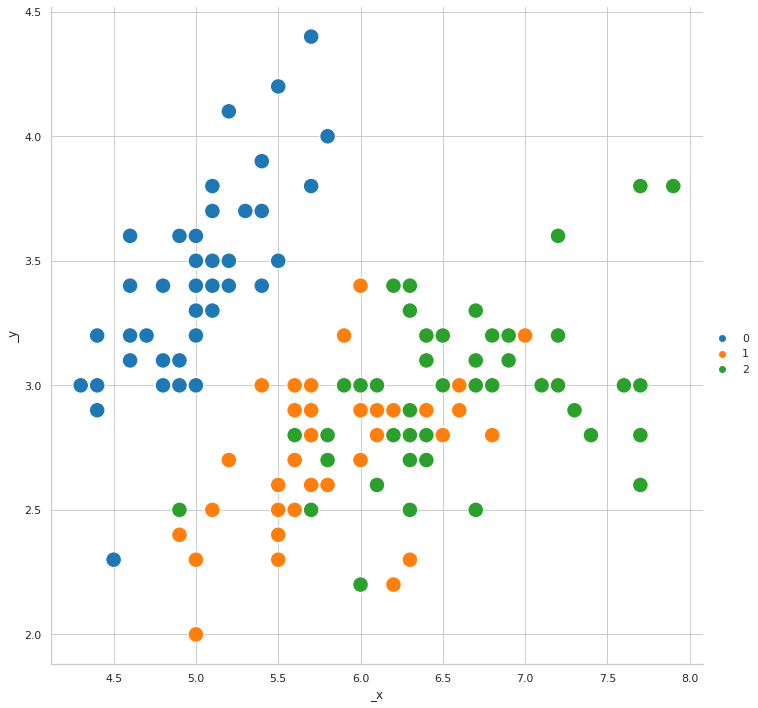

In [ ]:
pca = decomposition.PCA(n_components=2)
pca.fit(iris_X)
iris_X_reduced = pca.transform(iris_X)

sns.relplot(
    x=iris_X[:, 0],
    y=iris_X[:, 1],
    hue=iris_y,
    palette='tab10',
    height=10,
    s=250, #: marker (point) size
)

In [ ]:
kmeans = KMeans(n_clusters=3)
iris_y_kmeans = kmeans.fit_predict(iris_X)

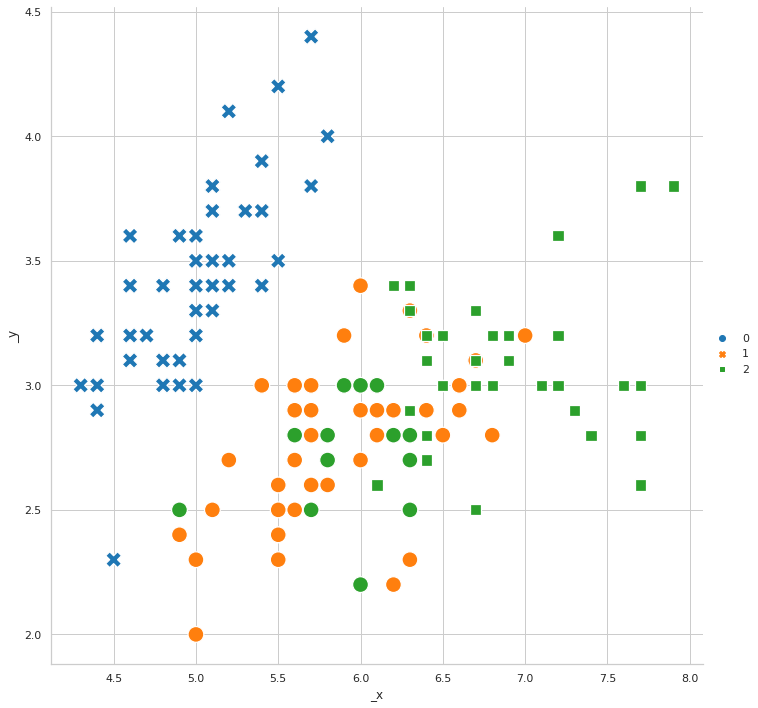

In [ ]:
sns.relplot(
    x=iris_X[:, 0],
    y=iris_X[:, 1],
    hue=iris_y,
    palette='tab10',
    style=iris_y_kmeans, #: marker style (circle, sqaure, cross, etc.)
    height=10,
    s=250,
)

In [ ]:
import hdbscan

clusterer = hdbscan.HDBSCAN(min_cluster_size=5)
iris_y_hdbscan = clusterer.fit_predict(iris_X)

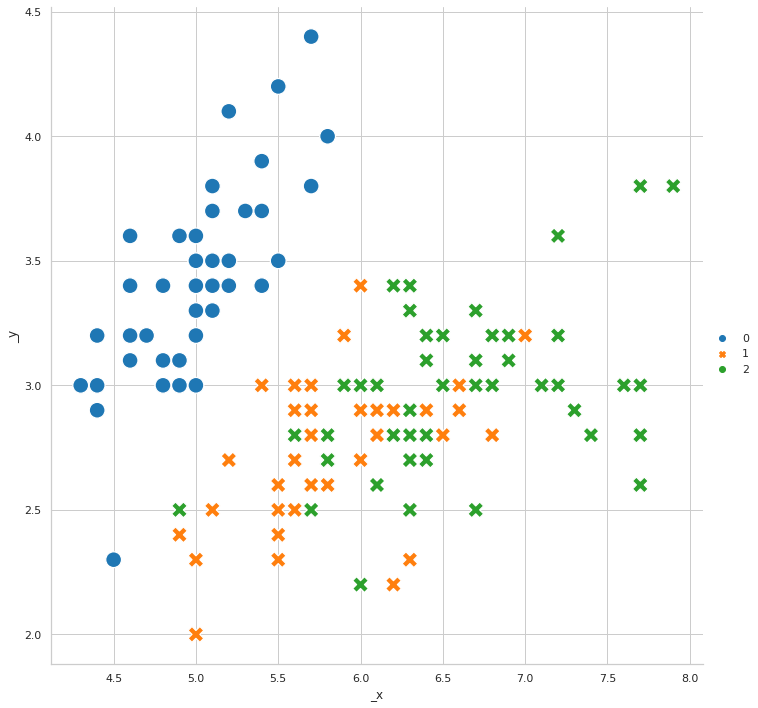

In [ ]:
sns.relplot(
    x=iris_X[:, 0],
    y=iris_X[:, 1],
    hue=iris_y,
    palette='tab10',
    style=iris_y_hdbscan,
    height=10,
    s=250,
)

In [ ]:
def iris_3d(y):
  fig = plt.figure(1, figsize=(12, 9))
  plt.clf() # clear figure
  ax = Axes3D(fig, rect=[0, 0, 0.95, 1], elev=48, azim=134)

  plt.cla() # clear the active axis
  pca = decomposition.PCA(n_components=3)
  pca.fit(iris_X)
  iris_X_reduced = pca.transform(iris_X)

  ax.scatter(iris_X_reduced[:, 0], iris_X_reduced[:, 1], iris_X_reduced[:, 2],
            c=y, cmap=plt.cm.tab10, s=100)

  ax.w_xaxis.set_ticklabels([])
  ax.w_yaxis.set_ticklabels([])
  ax.w_zaxis.set_ticklabels([])

  plt.show()

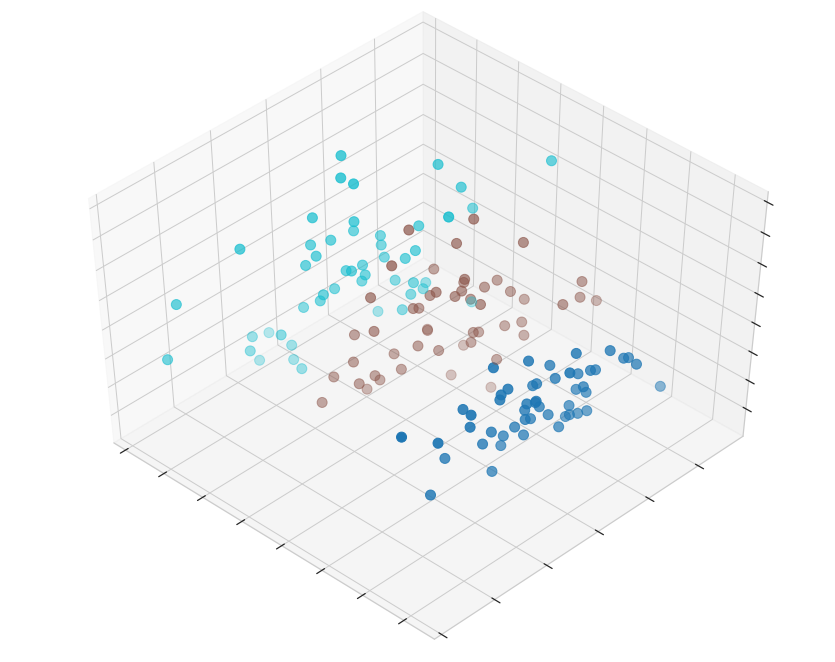

In [ ]:
iris_3d(iris_y)

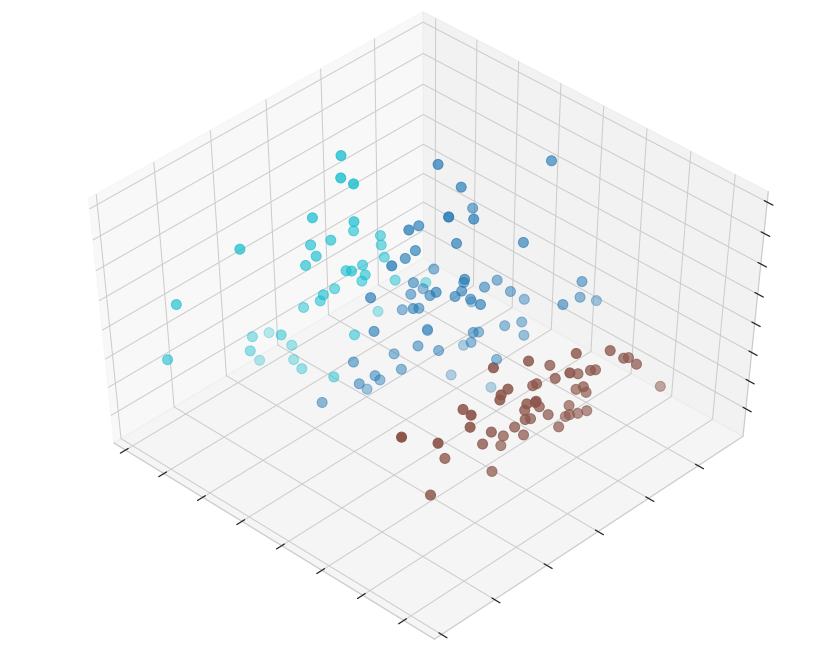

In [ ]:
iris_3d(iris_y_kmeans)

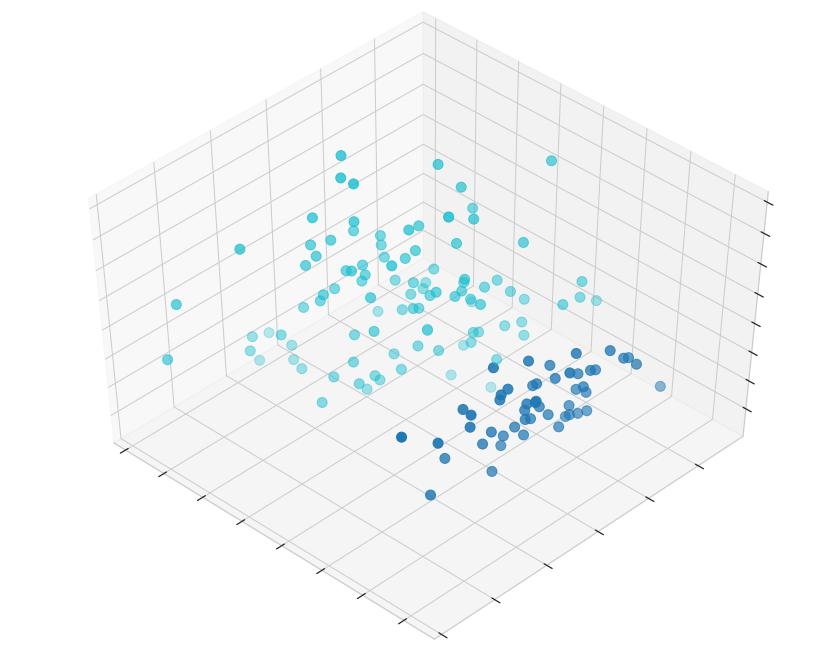

In [ ]:
iris_3d(iris_y_hdbscan)

### Regression

In [ ]:
diabetes_X, diabetes_y = datasets.load_diabetes(return_X_y=True)
diabetes_X_train = diabetes_X[:-20]
diabetes_X_test  = diabetes_X[-20:]
diabetes_y_train = diabetes_y[:-20]
diabetes_y_test  = diabetes_y[-20:]

In [ ]:
diabetes_X_train.shape

(422, 10)

In [ ]:
diabetes_y_train.shape

(422,)

In [ ]:
diabetes_X_test.shape

(20, 10)

In [ ]:
diabetes_y_test.shape

(20,)

In [ ]:
from sklearn import linear_model
regr = linear_model.LinearRegression()
regr.fit(diabetes_X_train, diabetes_y_train)

LinearRegression()

In [ ]:
diabetes_y_predicted = regr.predict(diabetes_X_test)
diabetes_y_predicted.shape

(20,)

We can calculate the mean square error loss manually:

In [ ]:
np.mean((diabetes_y_predicted - diabetes_y_test)**2)

2004.5676026898207

scikit-learn estimators have the `score` function to give us a measure of their loss.

In this case, an explained variance score 1 is perfect prediction and 0 means that there is no linear relationship between X and y.

In [ ]:
regr.score(diabetes_X_test, diabetes_y_test)

0.5850753022690575

# Deleted content

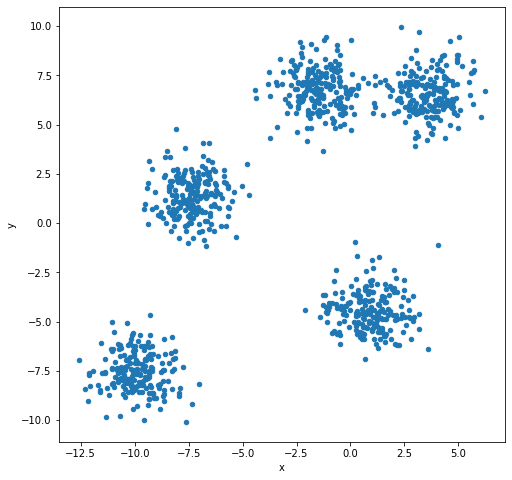

In [ ]:
fig , ax = plt.subplots(figsize = (8,8))
df.plot(ax=ax , kind='scatter' , x='x' , y='y')
plt.xlabel = 'X'
plt.ylabel = 'y'
plt.show()

In [ ]:
%%bash

wget https://files.lilf.ir/tmp/survey_results_public.csv -o /survey_results_public.csv || echo error

In [ ]:
%%bash
ls -hl /survey_results_public.csv 

-rw-r--r-- 1 root root 139K Mar 31 13:49 /survey_results_public.csv
